# *Populus* и лексика человеческих общностей у Августина
## Ноутбук 1. Основной анализ

Ноутбук воспроизводит вычисления, на которых основаны разделы 3 и 4 статьи, а также рисунки и таблицы Приложения. Все таблицы и рисунки выводятся прямо в ячейках; в папку `figures/` сохраняются только изображения.

| Раздел ноутбука | Что получается | Где в статье |
| --- | --- | --- |
| 4. Фоновое распределение сходства | среднее, перцентили, гистограмма | разд. 3; рис. П1 |
| 5. Ближайшие соседи целевых лемм | списки соседей, окружение *populus* | табл. 3, табл. П1 |
| 6. Выбор порога | θ = 0,47 | разд. 3; рис. П2 |
| 7. Основная сеть и сообщества | 232 леммы, 8 сообществ | рис. 1, табл. 1 |
| 8. Сообщества по отдельности | подписанные подграфы сообществ | дополнительный материал |
| 9. Локальные сети 6–4 | сети всех 18 целевых лемм | табл. 2, рис. 2–4 |
| 10. Сходства целевых лемм | тепловая карта 18 × 18 | дополнительный материал |
| 11. Числа, приводимые в статье | сводная таблица значений | разд. 4–5 |

Проверки устойчивости (число соседей, порог, повторные запуски, UMAP/HDBSCAN) вынесены во второй ноутбук.

**Как запускать.** Выполните ячейки по порядку сверху вниз (в Colab: «Среда выполнения → Выполнить все»). Если после установки библиотек Colab попросит перезапустить среду, перезапустите её и снова выполните все ячейки.

**Об орфографии.** Леммы приводятся так, как они записаны в словаре модели: *ciuitas, uulgus, ciuis*. В тексте статьи используется традиционная орфография (*civitas, vulgus, civis*).

## 1. Подготовка среды

Ячейка проверяет, установлены ли нужные библиотеки, и при необходимости устанавливает недостающие.

In [1]:
import importlib.util, subprocess, sys

REQUIRED = {                 # имя модуля : имя пакета для установки
    "gensim": "gensim",
    "igraph": "igraph",
    "leidenalg": "leidenalg",
    "seaborn": "seaborn",
}
missing = [pkg for module, pkg in REQUIRED.items()
           if importlib.util.find_spec(module) is None]

if missing:
    print("Устанавливаются библиотеки:", ", ".join(missing))
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", *missing])
else:
    print("Все необходимые библиотеки уже установлены.")

Все необходимые библиотеки уже установлены.


## 2. Параметры анализа и загрузка модели

Здесь собраны все параметры, от которых зависит результат. Их значения соответствуют описанию в разделе 3 статьи.

Модель Word2Vec опубликована разработчиками (Э. Врангбек и коллеги) и загружается из их репозитория. Контрольная сумма SHA-256 позволяет убедиться, что используется та же самая модель, что и в статье.

In [2]:
import hashlib, os, urllib.request

import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.patheffects as pe
from matplotlib.lines import Line2D
import seaborn as sns
import igraph as ig
import leidenalg
from gensim.models import Word2Vec
from sklearn.metrics.pairwise import cosine_similarity
from IPython.display import display, Markdown

# --- Параметры исследования ---------------------------------------------
SEED = 42                     # фиксированное начальное значение случайных процедур
TOP_N = 15                    # число ближайших соседей каждой целевой леммы
THRESHOLD_GRID = np.round(np.arange(0.30, 0.801, 0.01), 2)   # проверяемые пороги
LOCAL_FIRST, LOCAL_SECOND = 6, 4                             # схема локальных сетей 6–4

# Восемнадцать целевых лемм (в орфографии словаря модели)
DESIGNATIONS = ["populus", "plebs", "gens", "natio", "multitudo", "congregatio",
                "turba", "uulgus", "ciuitas", "societas", "ecclesia"]
LAW = ["ius", "iustitia"]
LOVE_AND_CONCORD = ["amor", "caritas", "dilectio", "concordia", "pax"]
TARGET_TERMS = DESIGNATIONS + LAW + LOVE_AND_CONCORD

# --- Модель --------------------------------------------------------------
MODEL_URL = "https://github.com/eehvrangbaek/aug_will_love/raw/main/dat/word2vec.model"
MODEL_FILE = "word2vec.model"
MODEL_SHA256 = "a3a336148d8dbfa53778c3ea911aa285797b7e3902acba35edde98bedf6ea105"

# --- Рисунки -------------------------------------------------------------
FIG_DIR = "figures"
FIG_DPI = 300                 # разрешение сохраняемых изображений
os.makedirs(FIG_DIR, exist_ok=True)

sns.set_style("white")
plt.rcParams.update({
    "figure.dpi": 120, "font.family": "DejaVu Sans", "font.size": 12,
    "axes.titlesize": 15, "axes.labelsize": 13, "xtick.labelsize": 11,
    "ytick.labelsize": 11, "legend.fontsize": 11,
    "figure.facecolor": "white", "savefig.facecolor": "white",
})
np.random.seed(SEED)

# --- Загрузка и проверка модели -----------------------------------------
if not os.path.exists(MODEL_FILE):
    print("Загружается модель из репозитория разработчиков…")
    urllib.request.urlretrieve(MODEL_URL, MODEL_FILE)

with open(MODEL_FILE, "rb") as f:
    checksum = hashlib.sha256(f.read()).hexdigest()
if checksum != MODEL_SHA256:
    raise ValueError("Контрольная сумма не совпадает: это другая версия модели.")

model = Word2Vec.load(MODEL_FILE)
wv = model.wv

missing_terms = [t for t in TARGET_TERMS if t not in wv]
if missing_terms:
    raise ValueError("В словаре модели нет лемм: " + ", ".join(missing_terms))

display(pd.DataFrame([
    ("Архитектура", "CBOW" if model.sg == 0 else "Skip-gram"),
    ("Лемм в словаре", len(wv)),
    ("Размерность векторов", model.vector_size),
    ("Контекстное окно", model.window),
    ("Минимальная частота", model.min_count),
    ("Эпох обучения", model.epochs),
    ("Отрицательных примеров", model.negative),
    ("Словоупотреблений, обработанных при обучении", f"{model.corpus_total_words:,}".replace(",", " ")),
], columns=["Параметр модели", "Значение"]).set_index("Параметр модели"))

,Значение
Параметр модели,
Архитектура,CBOW
Лемм в словаре,9563
Размерность векторов,50
Контекстное окно,5
Минимальная частота,10
Эпох обучения,10
Отрицательных примеров,5
"Словоупотреблений, обработанных при обучении",2 780 899


## 3. Вспомогательные функции

В этой ячейке собраны все функции, которые используются ниже: построение сетей, выделение сообществ и рисунки. Её достаточно просто выполнить. Каждая функция снабжена кратким пояснением.

In [3]:
# ---------------------------------------------------------------------------
# Сохранение рисунков
# ---------------------------------------------------------------------------
def save_figure(fig, name, folder=FIG_DIR):
    # Показывает рисунок в ноутбуке и сохраняет его в PNG.
    path = os.path.join(folder, name + ".png")
    os.makedirs(os.path.dirname(path), exist_ok=True)
    fig.savefig(path, dpi=FIG_DPI, bbox_inches="tight", facecolor="white")
    plt.show()
    plt.close(fig)
    print("Сохранено:", path)


# ---------------------------------------------------------------------------
# Сеть и сообщества
# ---------------------------------------------------------------------------
def build_network(lemmas, similarity, threshold):
    # Соединяет ребром каждую пару лемм, косинусное сходство которых не ниже порога.
    rows, cols = np.triu_indices(len(lemmas), k=1)
    weights = similarity[rows, cols]
    keep = weights >= threshold
    graph = nx.Graph()
    graph.add_nodes_from(lemmas)
    for i, j, w in zip(rows[keep], cols[keep], weights[keep]):
        graph.add_edge(lemmas[i], lemmas[j], weight=float(w))
    return graph


def find_communities(graph, seed=SEED):
    # Выделяет сообщества алгоритмом Лейдена и возвращает
    # принадлежность каждой леммы и модулярность Q.
    lemmas = list(graph.nodes)
    index = {lemma: i for i, lemma in enumerate(lemmas)}
    edges = [(index[u], index[v]) for u, v in graph.edges]
    weights = [graph[u][v]["weight"] for u, v in graph.edges]
    g = ig.Graph(n=len(lemmas), edges=edges)
    g.es["weight"] = weights
    part = leidenalg.find_partition(g, leidenalg.ModularityVertexPartition,
                                    weights=weights, seed=int(seed))
    membership = {lemmas[i]: c for i, c in enumerate(part.membership)}
    modularity = g.modularity(part.membership, weights=weights)
    return article_numbering(membership), modularity


def article_numbering(membership):
    # Перенумеровывает сообщества так, как в табл. 1 статьи:
    # номер определяется целевой леммой, которая в него входит.
    anchors = [("ecclesia", 1), ("populus", 2), ("amor", 3), ("multitudo", 4),
               ("ciuitas", 5), ("ius", 6), ("iustitia", 7), ("turba", 8)]
    new_number = {}
    for lemma, number in anchors:
        new_number.setdefault(membership[lemma], number)
    extra = 9
    for old in sorted(set(membership.values())):
        if old not in new_number:
            new_number[old] = extra
            extra += 1
    return {lemma: new_number[c] for lemma, c in membership.items()}


# ---------------------------------------------------------------------------
# Локальные сети по схеме 6–4
# ---------------------------------------------------------------------------
def local_network_6_4(seed_lemma, first=LOCAL_FIRST, second=LOCAL_SECOND):
    # Затравочная лемма → её 6 ближайших соседей (первый уровень)
    # → по 4 ближайших соседа каждого из них (второй уровень).
    graph = nx.Graph()
    graph.add_node(seed_lemma, level=0)
    for word1, sim1 in wv.most_similar(seed_lemma, topn=first):
        graph.add_node(word1, level=1)
        graph.add_edge(seed_lemma, word1, weight=float(sim1), relation="first")
        candidates = [(w, s) for w, s in wv.most_similar(word1, topn=second + 10)
                      if w != seed_lemma][:second]
        for word2, sim2 in candidates:
            if word2 not in graph:
                graph.add_node(word2, level=2)
            if graph.has_edge(word1, word2):
                continue          # связь первого уровня уже есть
            graph.add_edge(word1, word2, weight=float(sim2), relation="second")
    return graph


# ---------------------------------------------------------------------------
# Раскладка рисунков
# ---------------------------------------------------------------------------
def orient(positions, anchor):
    # Отражает раскладку так, чтобы указанная лемма оказалась слева внизу:
    # это делает рисунки сопоставимыми между запусками.
    xs = np.array([p[0] for p in positions.values()])
    ys = np.array([p[1] for p in positions.values()])
    x_mid, y_mid = (xs.min() + xs.max()) / 2, (ys.min() + ys.max()) / 2
    fx = 1 if positions[anchor][0] <= x_mid else -1
    fy = 1 if positions[anchor][1] <= y_mid else -1
    return {n: ((p[0] - x_mid) * fx + x_mid, (p[1] - y_mid) * fy + y_mid)
            for n, p in positions.items()}


def white_outline(text, width):
    text.set_path_effects([pe.withStroke(linewidth=width, foreground="white")])


# ---------------------------------------------------------------------------
# Рисунок основной сети
# ---------------------------------------------------------------------------
def draw_main_network(graph, membership, colors, positions, labelled, threshold, modularity):
    fig, ax = plt.subplots(figsize=(20, 15))
    span = max(1.0 - threshold, 1e-6)
    for u, v, data in graph.edges(data=True):
        f = (data["weight"] - threshold) / span          # чем сильнее связь, тем толще линия
        ax.plot([positions[u][0], positions[v][0]], [positions[u][1], positions[v][1]],
                color="#555555", alpha=0.45 + 0.50 * f, linewidth=0.8 + 3.0 * f, zorder=1)
    for node in graph.nodes:
        is_target = node in TARGET_TERMS
        ax.scatter(*positions[node], s=2600 if is_target else 420,
                   c=[colors[membership[node]]], alpha=0.90, zorder=3,
                   edgecolors="black" if is_target else "#555555",
                   linewidths=2.5 if is_target else 0.6)
    for node in graph.nodes:
        if node not in TARGET_TERMS and node not in labelled:
            continue
        is_target = node in TARGET_TERMS
        t = ax.text(*positions[node], node.upper() if is_target else node,
                    fontsize=17 if is_target else 9.5,
                    fontweight="bold" if is_target else "normal",
                    ha="center", va="center", zorder=5, color="#1a1a1a")
        white_outline(t, 4 if is_target else 2.2)
    legend = [Line2D([0], [0], marker="o", color="w", label="Целевая лемма",
                     markerfacecolor="white", markeredgecolor="black",
                     markeredgewidth=2.5, markersize=20)]
    for c in sorted(colors):
        targets = [t for t in TARGET_TERMS if membership[t] == c]
        label = f"Сообщество {c}" + (f" ({', '.join(targets)})" if targets else "")
        legend.append(mpatches.Patch(facecolor=colors[c], edgecolor="#333333", label=label))
    ax.legend(handles=legend, loc="upper left", bbox_to_anchor=(1.0, 1.0), framealpha=0.95,
              title="Сообщества (алгоритм Лейдена)", title_fontsize=14,
              borderpad=1, labelspacing=1.1, fontsize=12)
    ax.set_title("Сеть дистрибутивного сходства\n"
                 f"{graph.number_of_nodes()} лемм · θ = {threshold:.2f} · "
                 f"{graph.number_of_edges()} рёбер · Q = {modularity:.3f}", fontsize=17, pad=20)
    ax.axis("off")
    return fig


# ---------------------------------------------------------------------------
# Рисунок одного сообщества
# ---------------------------------------------------------------------------
def draw_community(graph, membership, colors, community, threshold):
    nodes = [n for n in graph.nodes if membership[n] == community]
    sub = graph.subgraph(nodes).copy()
    targets = [t for t in TARGET_TERMS if t in sub]
    anchor = "populus" if "populus" in sub else (targets[0] if targets else
             max(sub.degree, key=lambda item: item[1])[0])
    k = 1.6 if sub.number_of_nodes() <= 25 else 1.2
    pos = orient(nx.spring_layout(sub, k=k, iterations=500, weight="weight", seed=SEED), anchor)
    fig, ax = plt.subplots(figsize=(14, 11))
    weights = [d["weight"] for _, _, d in sub.edges(data=True)]
    w_min = min(weights) if weights else threshold
    span = max((max(weights) - w_min) if weights else 0.0, 1e-6)
    for u, v, d in sub.edges(data=True):
        f = (d["weight"] - w_min) / span
        ax.plot([pos[u][0], pos[v][0]], [pos[u][1], pos[v][1]], color="#666666",
                alpha=0.35 + 0.50 * f, linewidth=0.8 + 2.5 * f, zorder=1)
    degree = dict(sub.degree)
    for node in sub.nodes:
        is_target = node in TARGET_TERMS
        ax.scatter(*pos[node], s=1900 if is_target else 260 + 22 * degree[node],
                   c=[colors[community]], alpha=0.92, zorder=2,
                   edgecolors="black" if is_target else "#555555",
                   linewidths=2.0 if is_target else 0.6)
        t = ax.text(*pos[node], node.upper() if is_target else node,
                    fontsize=12 if is_target else 9, fontweight="bold" if is_target else "normal",
                    ha="center", va="center", zorder=3)
        white_outline(t, 3 if is_target else 2)
    ax.set_title(f"Сообщество {community}: {', '.join(targets) or 'нет целевых лемм'}\n"
                 f"{sub.number_of_nodes()} узлов · {sub.number_of_edges()} внутренних рёбер",
                 fontsize=15, pad=16)
    ax.axis("off")
    return fig, anchor


# ---------------------------------------------------------------------------
# Рисунок локальной сети 6–4
# ---------------------------------------------------------------------------
def draw_local_network(seed_lemma, graph, ax=None, panel=""):
    # Цвет узла — кластер внутри локальной сети (алгоритм Лувена).
    # Если передана ось ax, сеть рисуется на ней (для рисунка из нескольких панелей).
    groups = nx.community.louvain_communities(graph, weight="weight", seed=SEED)
    group_of = {n: i for i, members in enumerate(groups, start=1) for n in members}
    palette = sns.color_palette("Set2", len(groups))
    colors = {i: palette[i - 1] for i in range(1, len(groups) + 1)}
    pos = orient(nx.spring_layout(graph, k=1.35, iterations=600, weight="weight", seed=SEED),
                 seed_lemma)
    fig = None
    if ax is None:
        fig, ax = plt.subplots(figsize=(15, 11))
    weights = [d["weight"] for _, _, d in graph.edges(data=True)]
    w_min, span = min(weights), max(max(weights) - min(weights), 1e-6)
    for u, v, d in graph.edges(data=True):
        f = (d["weight"] - w_min) / span
        ax.plot([pos[u][0], pos[v][0]], [pos[u][1], pos[v][1]], color="#555555",
                alpha=0.35 + 0.55 * f,
                linewidth=(1.6 if d["relation"] == "first" else 0.8) + 2.2 * f, zorder=1)
    for node in graph.nodes:
        level = graph.nodes[node]["level"]
        ax.scatter(*pos[node], s={0: 3000, 1: 1700, 2: 650}[level],
                   c=[colors[group_of[node]]], edgecolors="black",
                   linewidths=2.5 if level == 0 else 1.2, alpha=0.94, zorder=2)
        t = ax.text(*pos[node], node.upper() if level == 0 else node,
                    fontsize={0: 15, 1: 11, 2: 9}[level],
                    fontweight="bold" if level <= 1 else "normal",
                    ha="center", va="center", zorder=3)
        white_outline(t, 3 if level <= 1 else 2)
    legend = [Line2D([0], [0], marker="o", color="w", label=label, markerfacecolor=face,
                     markeredgecolor="black", markersize=size)
              for label, face, size in [("Затравочная лемма", "white", 16),
                                        ("Первый уровень", "#bbbbbb", 12),
                                        ("Второй уровень", "#bbbbbb", 8)]]
    legend += [mpatches.Patch(facecolor=colors[i], edgecolor="#333333", label=f"Кластер {i}")
               for i in colors]
    ax.legend(handles=legend, loc="best", framealpha=0.95,
              title="Уровни и кластеры", title_fontsize=12)
    ax.set_title(f"{panel}Локальная сеть {seed_lemma.upper()} по схеме 6–4\n"
                 f"{graph.number_of_nodes()} узлов · {graph.number_of_edges()} рёбер · без порога θ",
                 fontsize=16, pad=18)
    ax.axis("off")
    return fig


print("Функции готовы.")

Функции готовы.


## 4. Фоновое распределение косинусного сходства

Чтобы понимать, какое значение сходства можно считать высоким, сходство рассчитывается для **всех** пар лемм словаря (около 45,7 млн пар). Среднее значение и перцентили приводятся в разделе 3 статьи; гистограмма — рис. П1 Приложения.

In [4]:
vectors = wv.get_normed_vectors()
parts = []
for start in range(0, len(wv), 1000):            # считаем блоками, чтобы хватило памяти
    block = vectors[start:start + 1000] @ vectors.T
    for i in range(block.shape[0]):
        parts.append(block[i, start + i + 1:])     # только пары «лемма – следующие леммы»
all_similarities = np.concatenate(parts)
del parts

mean_sim, std_sim = all_similarities.mean(), all_similarities.std()
p95, p99 = np.percentile(all_similarities, [95, 99])

display(pd.DataFrame([
    ("Число уникальных пар", f"{len(all_similarities):,}".replace(",", " ")),
    ("Среднее", f"{mean_sim:.4f}"),
    ("Стандартное отклонение", f"{std_sim:.4f}"),
    ("95-й перцентиль", f"{p95:.4f}"),
    ("99-й перцентиль", f"{p99:.4f}"),
], columns=["Показатель", "Значение"]).set_index("Показатель"))

,Значение
Показатель,
Число уникальных пар,45 720 703
Среднее,0.0476
Стандартное отклонение,0.1718
95-й перцентиль,0.3387
99-й перцентиль,0.4651


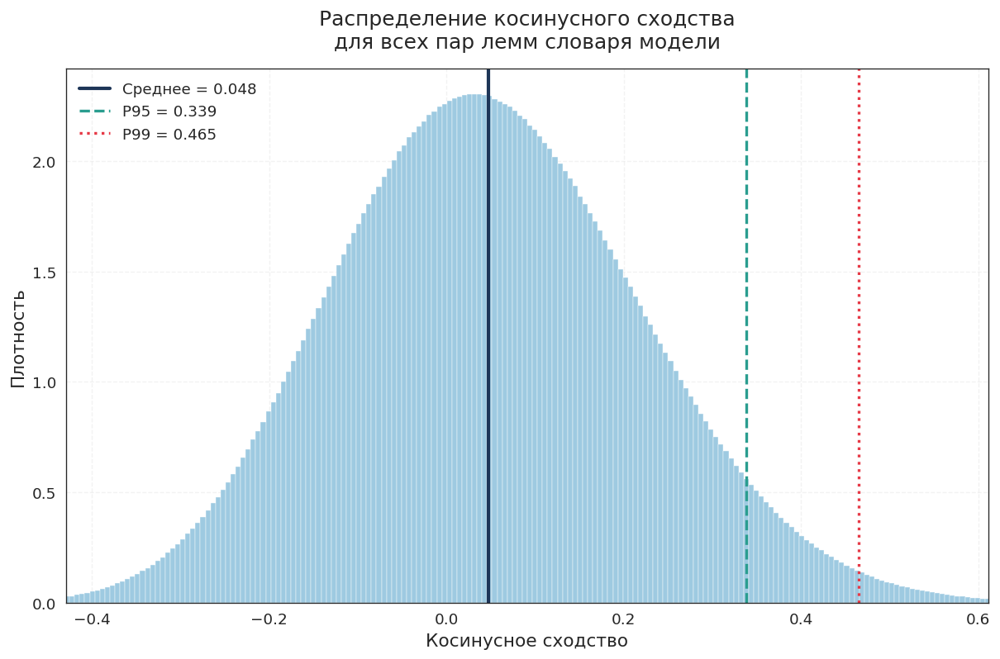

Сохранено: figures/FigA1_cosine_distribution.png


In [5]:
fig, ax = plt.subplots(figsize=(12, 7))
ax.hist(all_similarities, bins=300, density=True, color="#9ecae1",
        edgecolor="white", linewidth=0.25)
ax.axvline(mean_sim, color="#1d3557", linewidth=2.5, label=f"Среднее = {mean_sim:.3f}")
ax.axvline(p95, color="#2a9d8f", linewidth=2, linestyle="--", label=f"P95 = {p95:.3f}")
ax.axvline(p99, color="#e63946", linewidth=2, linestyle=":", label=f"P99 = {p99:.3f}")
ax.set_xlabel("Косинусное сходство")
ax.set_ylabel("Плотность")
ax.set_title("Распределение косинусного сходства\nдля всех пар лемм словаря модели", pad=15)
ax.grid(True, linestyle="--", alpha=0.25)
ax.legend(frameon=False)
ax.set_xlim(*np.percentile(all_similarities, [0.1, 99.9]))
save_figure(fig, "FigA1_cosine_distribution")

## 5. Ближайшие соседи целевых лемм

Для каждой из 18 целевых лемм извлекаются 15 ближайших соседей. Списки выводятся **без какой-либо фильтрации**: орфографические варианты, ненормализованные словоформы и ошибочные леммы сохранены (о них — разд. 3 статьи).

Первая таблица соответствует табл. 3 статьи (10 соседей обозначений человеческих общностей), вторая — табл. П1 Приложения (15 соседей всех 18 лемм; переводы даны в Приложении).

In [6]:
neighbours = {term: wv.most_similar(term, topn=TOP_N) for term in TARGET_TERMS}

def neighbour_row(term, n):
    return {"Лемма": term,
            "Частота": wv.get_vecattr(term, "count"),
            f"{n} ближайших соседей (косинусное сходство)":
                "; ".join(f"{w} {s:.3f}" for w, s in neighbours[term][:n])}

display(Markdown("**Таблица 3. Десять ближайших соседей обозначений человеческих общностей**"))
display(pd.DataFrame([neighbour_row(t, 10) for t in DESIGNATIONS]).set_index("Лемма")
        .style.set_properties(**{"text-align": "left", "white-space": "normal"}))

display(Markdown("**Таблица П1. Пятнадцать ближайших соседей всех целевых лемм** (длинный формат)"))
table_a1 = pd.DataFrame([
    {"Лемма": term, "№": rank, "Сосед": word, "Косинусное сходство": round(sim, 3),
     "Частота соседа": wv.get_vecattr(word, "count")}
    for term in TARGET_TERMS
    for rank, (word, sim) in enumerate(neighbours[term], start=1)
])
display(table_a1.set_index(["Лемма", "№"]))

# Словарь основной сети: целевые леммы и все их соседи
lemmas = sorted(set(TARGET_TERMS) | {w for term in TARGET_TERMS for w, _ in neighbours[term]})
similarity = cosine_similarity(np.array([wv[w] for w in lemmas]))
print(f"Словарь основной сети: {len(lemmas)} лемм")

**Таблица 3. Десять ближайших соседей обозначений человеческих общностей**

,Частота,10 ближайших соседей (косинусное сходство)
Лемма,,
populus,3965,Israel 0.702; Israelitaris 0.682; Israhel 0.677; gens 0.663; plebs 0.663; alienigenus 0.622; synagoga 0.619; dispersio 0.615; Tyrus 0.611; rex 0.602
plebs,449,re-pello 0.745; populus 0.663; plebibus 0.618; Tyrius 0.596; congregatio 0.581; tribunus 0.573; iudaeis 0.561; dux 0.555; synagoga 0.550; gens 0.545
gens,4329,credituras 0.737; natio 0.684; dis-permulceo 0.665; populus 0.663; Israelitaris 0.654; annuntiate 0.650; Israelitis 0.650; benedicuntur 0.613; Iudaizaris 0.605; congrego 0.598
natio,103,gens 0.684; disperdo 0.595; tortuosus 0.582; credituras 0.546; iudaeorum 0.535; dis-permulceo 0.532; circuitus 0.531; dispersio 0.523; barbara 0.512; sculptile 0.511
multitudo,626,multitudi 0.712; paucitas 0.613; congregatio 0.605; paucus 0.564; numerositas 0.558; coitus 0.555; saluantur 0.533; celeber 0.532; superbiant 0.525; dilato 0.519
congregatio,241,discissio 0.626; congrego 0.619; segregatio 0.613; divisio 0.609; multitudo 0.605; Galatia 0.601; ecclesia 0.590; plebs 0.581; unctio 0.567; synagoga 0.562
turba,496,convoco 0.655; ethnicus 0.607; agmen 0.564; Hierosolyma 0.559; navicula 0.554; nauis 0.542; publicanus 0.539; Ierosolymis 0.538; claudus 0.536; furiosus 0.532
uulgus,119,idea 0.649; usitor 0.640; inperitor 0.635; appellatiuum 0.633; praeterea 0.630; uulgaris 0.628; imperitus 0.626; fatuitas 0.626; ineptus 0.616; plumbeus 0.611
ciuitas,2063,ciuis 0.765; Babylonius 0.762; Ierusal 0.716; Hierusal 0.708; Babylo 0.699; Babylonia 0.678; excidium 0.671; Iericho 0.666; exercitus 0.661; collauda 0.654


**Таблица П1. Пятнадцать ближайших соседей всех целевых лемм** (длинный формат)

Сосед  Косинусное сходство  Частота соседа
Лемма   №                                                    
populus 1         Israel                0.702            1039
        2   Israelitaris                0.682              28
        3        Israhel                0.677             776
        4           gens                0.663            4329
        5          plebs                0.663             449
...                  ...                  ...             ...
pax     11      concordo                0.520             137
        12     hereditas                0.513             682
        13      societas                0.512             614
        14    clericatum                0.509              22
        15       pacatum                0.499              27

[270 rows x 3 columns]

Словарь основной сети: 232 лемм


### Окружение *populus* и формы имени Израиля

Имя Израиля представлено в словаре несколькими формами. Чтобы показать, что библейско-исторический характер окружения *populus* не сводится к повторению одного имени, эти формы сводятся в одну позицию, и список продолжается дальше (разд. 4 статьи). Основная сеть от этой операции **не меняется**.

In [7]:
populus_raw = wv.most_similar("populus", topn=40)
israel_forms = [w for w, _ in populus_raw[:TOP_N]
                if w.lower().startswith(("israel", "israhel"))]
print("Формы имени Израиля среди 15 ближайших соседей populus:", ", ".join(israel_forms))

folded = [(w, s) for w, s in populus_raw if not w.lower().startswith(("israel", "israhel"))]
display(Markdown("**Окружение *populus* после свёртки форм имени Израиля** "
                 "(первые десять позиций — остаток исходных пятнадцати, далее — следующие соседи)"))
display(pd.DataFrame(folded[:15], columns=["Сосед", "Косинусное сходство"])
        .round(3).rename_axis("№").rename(index=lambda i: i + 1))

Формы имени Израиля среди 15 ближайших соседей populus: Israel, Israelitaris, Israhel, Israhelitae, Israelitae


**Окружение *populus* после свёртки форм имени Израиля** (первые десять позиций — остаток исходных пятнадцати, далее — следующие соседи)

,Сосед,Косинусное сходство
№,,
1,gens,0.663
2,plebs,0.663
3,alienigenus,0.622
4,synagoga,0.619
5,dispersio,0.615
6,Tyrus,0.611
7,rex,0.602
8,Aegyptus,0.585
9,Judaicus,0.580


## 6. Выбор порога основной сети

Строятся сети со значениями порога от 0,30 до 0,80 (шаг 0,01). Выбирается **наибольшее** значение, при котором все 232 леммы ещё образуют одну связную сеть (разд. 3 статьи; рис. П2 Приложения).

Для каждого порога на рисунке показаны доля лемм в крупнейшей компоненте связности и модулярность разбиения, найденного алгоритмом Лейдена. Модулярность приводится описательно: она показывает, как по мере разрежения сети сообщества становятся отчётливее, но не используется для выбора порога.

Выбранный порог θ = 0.47; при θ = 0.48 компонент: 2
99-й перцентиль фонового распределения: 0.4651
θ = 0.30: рёбер 4799, плотность 0.18, Q = 0.433, сообществ 4
θ = 0.47: рёбер 1397, плотность 0.05, Q = 0.637, сообществ 8


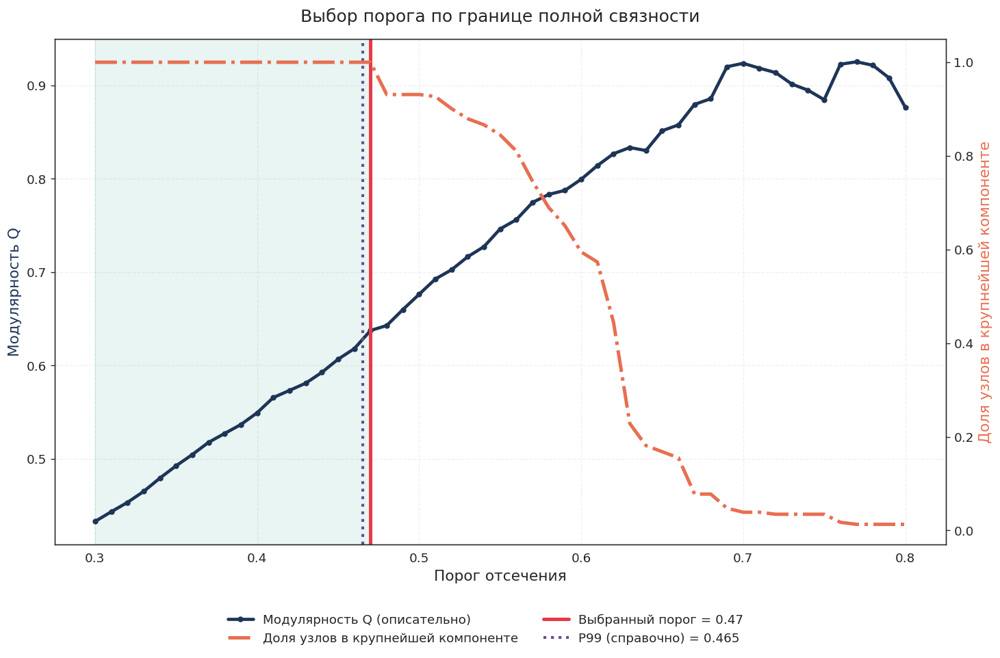

Сохранено: figures/FigA2_threshold_selection.png


In [8]:
scan = []
for threshold in THRESHOLD_GRID:
    g = build_network(lemmas, similarity, threshold)
    groups_of, q = find_communities(g)
    groups = len(set(groups_of.values()))
    largest = max(len(c) for c in nx.connected_components(g))
    scan.append({"Порог": threshold, "Рёбер": g.number_of_edges(), "Плотность": nx.density(g),
                 "Компонент": nx.number_connected_components(g),
                 "Доля лемм в крупнейшей компоненте": largest / len(lemmas),
                 "Модулярность Q": q, "Сообществ": groups})
scan = pd.DataFrame(scan)

THRESHOLD = float(scan.loc[scan["Компонент"] == 1, "Порог"].max())
row = lambda t: scan.loc[np.isclose(scan["Порог"], t)].iloc[0]
first, chosen, after = row(THRESHOLD_GRID[0]), row(THRESHOLD), row(THRESHOLD + 0.01)

print(f"Выбранный порог θ = {THRESHOLD:.2f}; при θ = {THRESHOLD + 0.01:.2f} компонент: {int(after['Компонент'])}")
print(f"99-й перцентиль фонового распределения: {p99:.4f}")
for label, r in [("θ = 0.30", first), (f"θ = {THRESHOLD:.2f}", chosen)]:
    print(f"{label}: рёбер {int(r['Рёбер'])}, плотность {r['Плотность']:.2f}, "
          f"Q = {r['Модулярность Q']:.3f}, сообществ {int(r['Сообществ'])}")

fig, ax1 = plt.subplots(figsize=(14, 8))
ax2 = ax1.twinx()
ax1.axvspan(THRESHOLD_GRID[0], THRESHOLD, color="#2a9d8f", alpha=0.10)      # область связной сети
ax1.plot(scan["Порог"], scan["Модулярность Q"], color="#1d3557", marker="o",
         markersize=4, linewidth=2.8, label="Модулярность Q (описательно)")
ax2.plot(scan["Порог"], scan["Доля лемм в крупнейшей компоненте"], color="#e76f51",
         linestyle="-.", linewidth=3, label="Доля узлов в крупнейшей компоненте")
ax1.axvline(THRESHOLD, color="#e63946", linewidth=3, label=f"Выбранный порог = {THRESHOLD:.2f}")
ax1.axvline(p99, color="#6a4c93", linestyle=":", linewidth=2.5, label=f"P99 (справочно) = {p99:.3f}")
ax1.set_xlabel("Порог отсечения")
ax1.set_ylabel("Модулярность Q", color="#1d3557")
ax2.set_ylabel("Доля узлов в крупнейшей компоненте", color="#e76f51")
ax2.set_ylim(-0.03, 1.05)
ax1.grid(True, linestyle="--", alpha=0.3)
ax1.set_title("Выбор порога по границе полной связности", pad=15)
handles = ax1.get_legend_handles_labels()[0][:1] + ax2.get_legend_handles_labels()[0] + ax1.get_legend_handles_labels()[0][1:]
labels = ax1.get_legend_handles_labels()[1][:1] + ax2.get_legend_handles_labels()[1] + ax1.get_legend_handles_labels()[1][1:]
fig.legend(handles, labels, loc="lower center", ncol=2, frameon=False, bbox_to_anchor=(0.5, -0.06))
save_figure(fig, "FigA2_threshold_selection")

## 7. Основная сеть и сообщества

На выбранном пороге строится основная сеть; её сообщества выделяются алгоритмом Лейдена. Номера сообществ приведены к нумерации табл. 1 статьи. На рисунке подписаны целевые леммы и 24 наиболее частотные леммы (рис. 1 статьи); полностью подписанные сообщества — в разделе 8 ноутбука.

In [9]:
G = build_network(lemmas, similarity, THRESHOLD)
membership, Q = find_communities(G)
communities = sorted(set(membership.values()))

print(f"Узлов: {G.number_of_nodes()} · рёбер: {G.number_of_edges()} · "
      f"сообществ: {len(communities)} · модулярность Q = {Q:.3f}")

display(Markdown("**Таблица 1. Сообщества основной сети**"))
display(pd.DataFrame([
    {"Сообщество": c,
     "Целевые леммы": ", ".join(t for t in TARGET_TERMS if membership[t] == c),
     "Число лемм": sum(1 for n in G if membership[n] == c),
     "Все леммы сообщества": ", ".join(sorted(n for n in G if membership[n] == c))}
    for c in communities
]).set_index("Сообщество").style.set_properties(**{"text-align": "left", "white-space": "normal"}))

Узлов: 232 · рёбер: 1397 · сообществ: 8 · модулярность Q = 0.637


**Таблица 1. Сообщества основной сети**

,Целевые леммы,Число лемм,Все леммы сообщества
Сообщество,,,
1,"congregatio, societas, ecclesia, concordia, pax",48,"Carthaginensis, Christianus, Cyprianus, catholicae, catholicam, catholicus, christiani, clericatum, cohaereo, coitus, communico, communio, communis, compago, concordi, concordia, concordo, congregatio, consortio, consortium, conspiro, copulo, devincio, diremptio, discissio, disjungo, divisio, ecclesia, haereticis, incolumitas, medietas, osculis, pacatum, pacatus, paries, pax, praecello, priuo, schisma, seditiosus, segregatio, sejungo, separo, societas, socio, uinculis, unitas, vinculum"
2,"populus, plebs, gens, natio",46,"Aegyptus, Galatia, Hebraeae, Israel, Israelitae, Israelitaris, Israelitis, Israhel, Israhelitae, Iudaizaris, Judaea, Judaeus, Judaicus, Tyrius, Tyrus, alienigenus, annuntiate, barbara, benedicuntur, circuitus, congrego, credituras, debello, dilato, dis-permulceo, disperdo, dispersio, diuisor, gens, hereditas, heredito, iudaeis, iudaeorum, iudaizaris, natio, orbis, pertinetis, plebs, populus, re-pello, rex, sculptile, segrego, synagoga, tortuosus, unctio"
3,"amor, caritas, dilectio",41,"adeptio, adipiscendae, adipiscor, amator, amissio, amo, amor, appeto, ardor, benevolens, benignitas, caritas, cooperatur, cupiditas, delectatio, deliquia, dilectio, diligo, exhortor, exopto, fervo, fiducia, flagro, fraternitas, fraternus, ino, inspiro, inuicem, legatio, longanimitas, mansuetudo, mutuus, pacificus, perfruor, perseveranter, propior, refrigesco, sanctitas, sincerus, sufferentes, timor"
4,"multitudo, uulgus",29,"alacritas, appellatiuum, celeber, fatuitas, furiosus, idea, imperitus, ineptus, ineruditus, inperitor, multitudi, multitudo, numerositas, paucitas, paucus, physicus, plumbeus, popularis, praeterea, saluantur, sectaris, soloecismus, superbiant, theologiae, urbanus, usitor, usquequaque, uulgaris, uulgus"
5,ciuitas,22,"Babylo, Babylonia, Babylonius, Datha, Hierusal, Hipponiensis, Iericho, Ierusal, Numa, Trojanus, agmen, ciuis, ciuitas, collauda, curia, dux, excidium, exercitus, plebibus, prouincia, supernam, tribunus"
6,ius,17,"consensus, criminosus, culpo, iniuria, institus, institutum, intervenio, ius, jus, liberi, licentia, oppressor, penso, rea, sunecho, uindico, usurpo"
7,iustitia,16,"aequitas, apponentur, deus, iniquitas, injustitia, iustificaris, iustificator, iustitia, iustus, justifico, justitia, justus, lex, misericordia, oboedientia, reputas"
8,turba,13,"Barabba, Hierosolyma, Ierosolymam, Ierosolymis, claudus, convoco, ethnicus, nauis, navicula, patrisfamilias, prandeo, publicanus, turba"


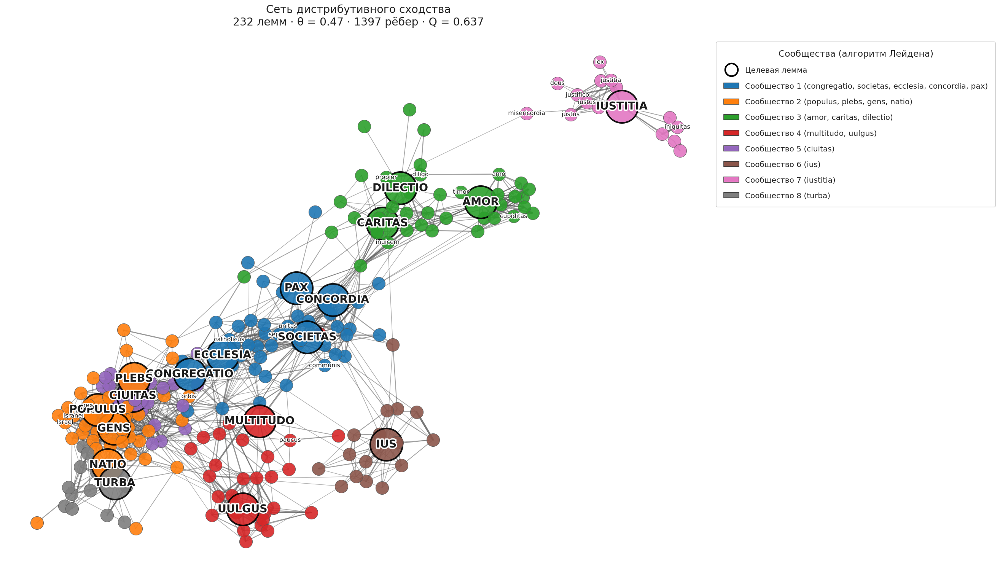

Сохранено: figures/Fig1_main_network.png


In [10]:
palette = sns.color_palette("tab10", len(communities))
community_colors = {c: palette[i] for i, c in enumerate(communities)}

labelled = set(sorted((n for n in G if n not in TARGET_TERMS),
                      key=lambda n: wv.get_vecattr(n, "count"), reverse=True)[:24])
positions = orient(nx.spring_layout(G, k=1.2, iterations=500, weight="weight", seed=SEED),
                   "populus")

fig = draw_main_network(G, membership, community_colors, positions, labelled, THRESHOLD, Q)
save_figure(fig, "Fig1_main_network")

## 8. Сообщества по отдельности

На общем рисунке подписаны не все узлы. Здесь каждое сообщество показано отдельно, с подписями всех лемм. Раскладка строится только по связям внутри сообщества, поэтому эти рисунки служат для чтения состава, а не для сравнения положения сообществ между собой. Цвета те же, что на рис. 1.

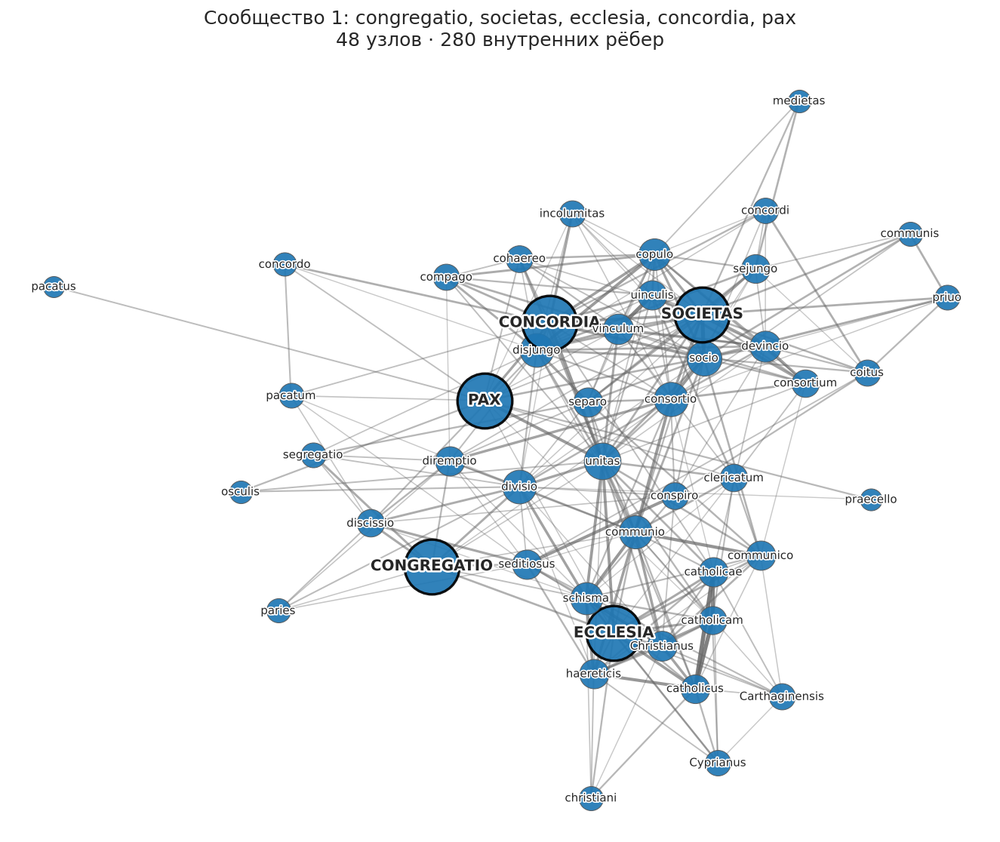

Сохранено: figures/communities/community_1_congregatio.png


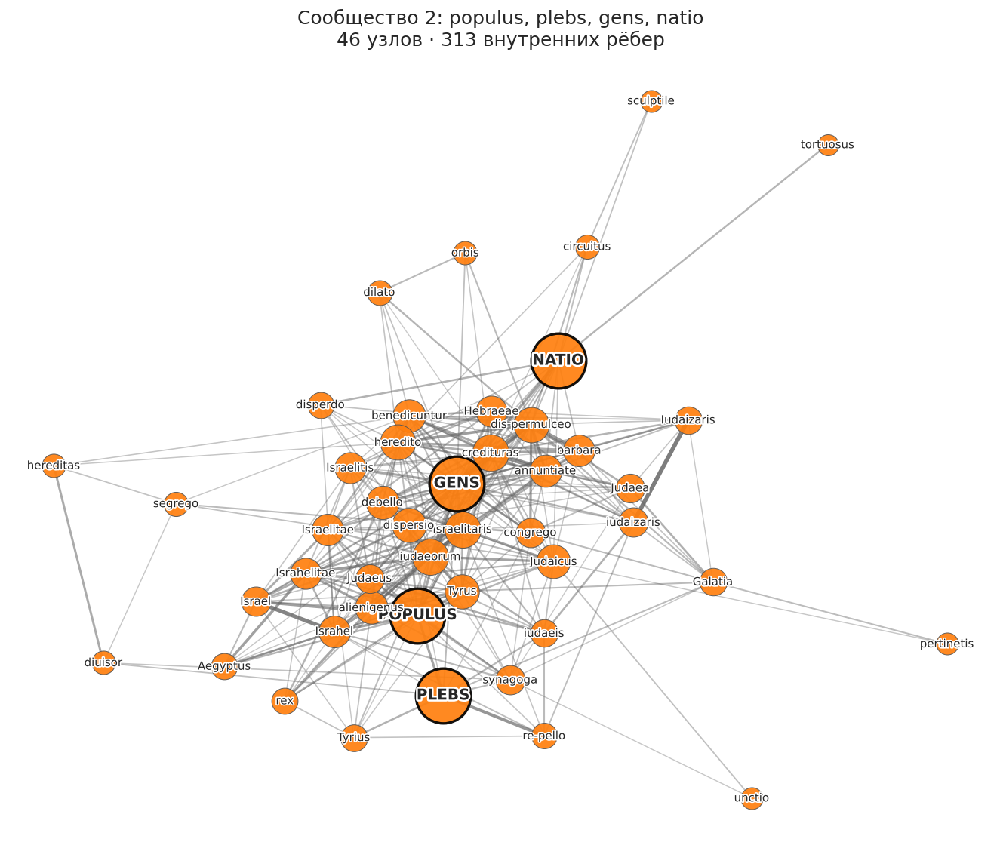

Сохранено: figures/communities/community_2_populus.png


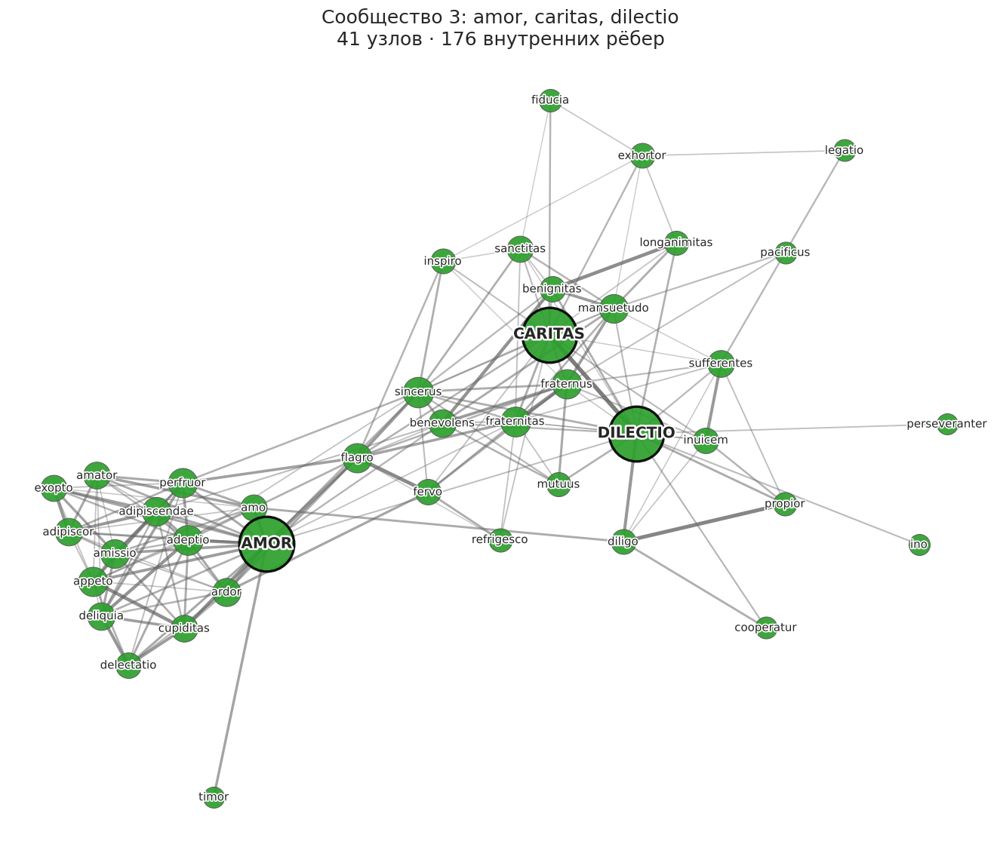

Сохранено: figures/communities/community_3_amor.png


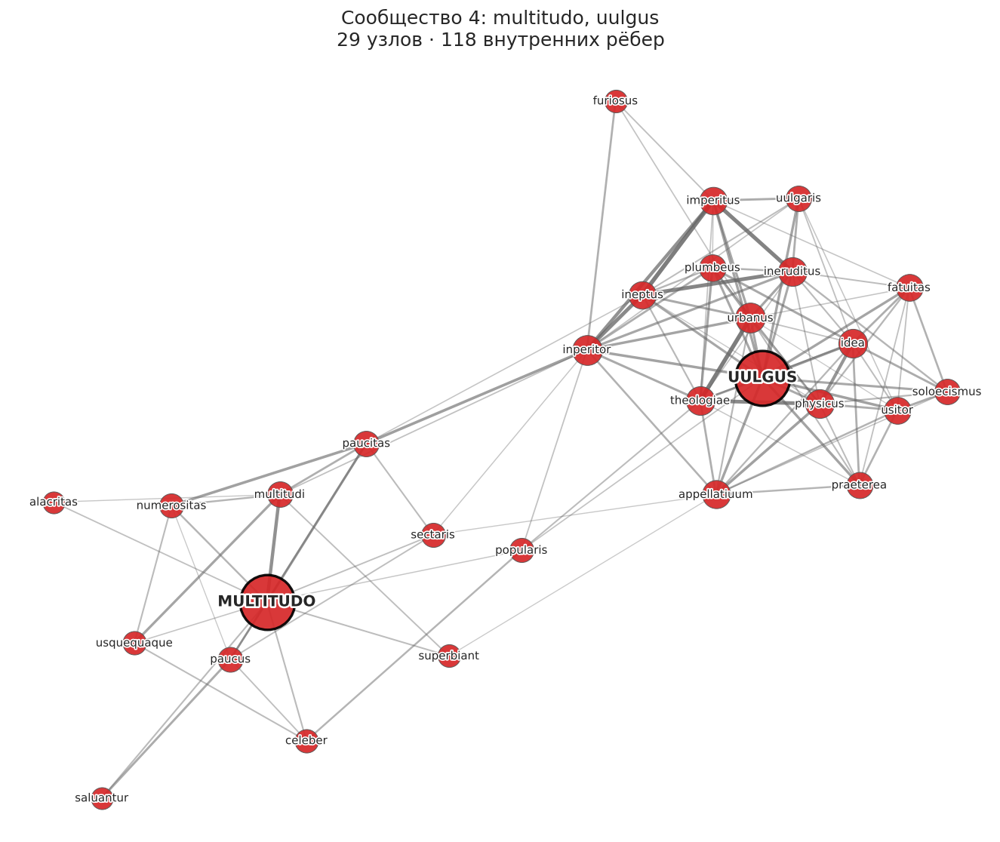

Сохранено: figures/communities/community_4_multitudo.png


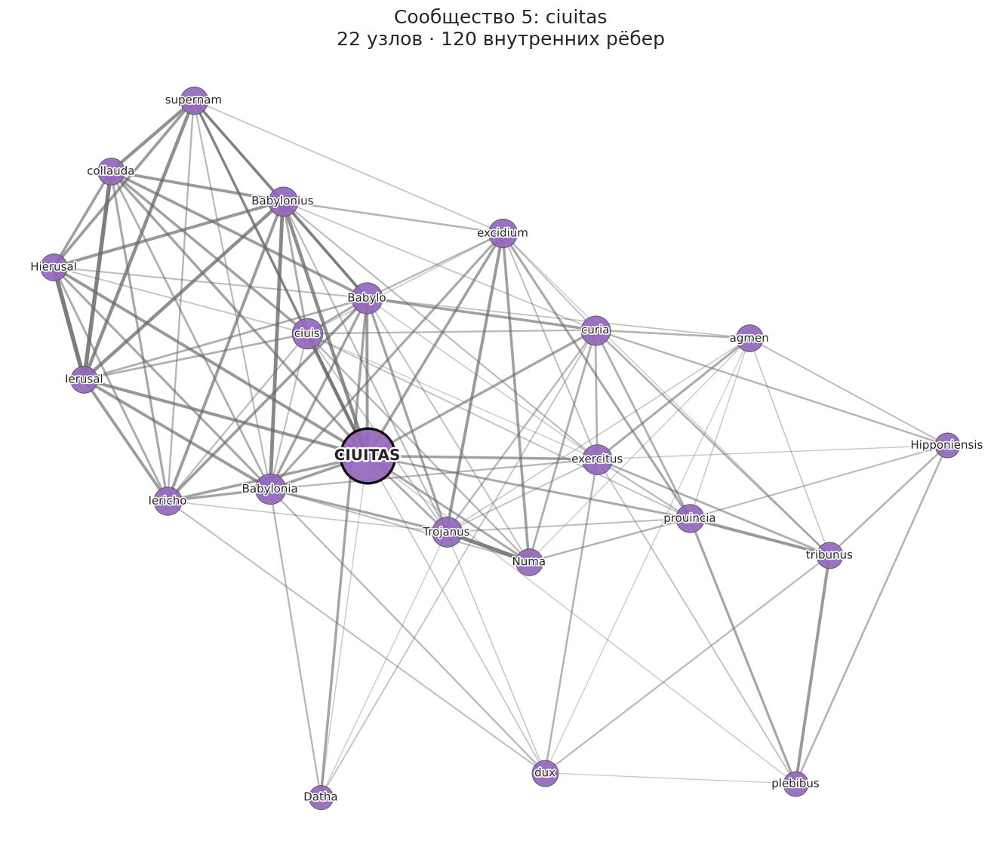

Сохранено: figures/communities/community_5_ciuitas.png


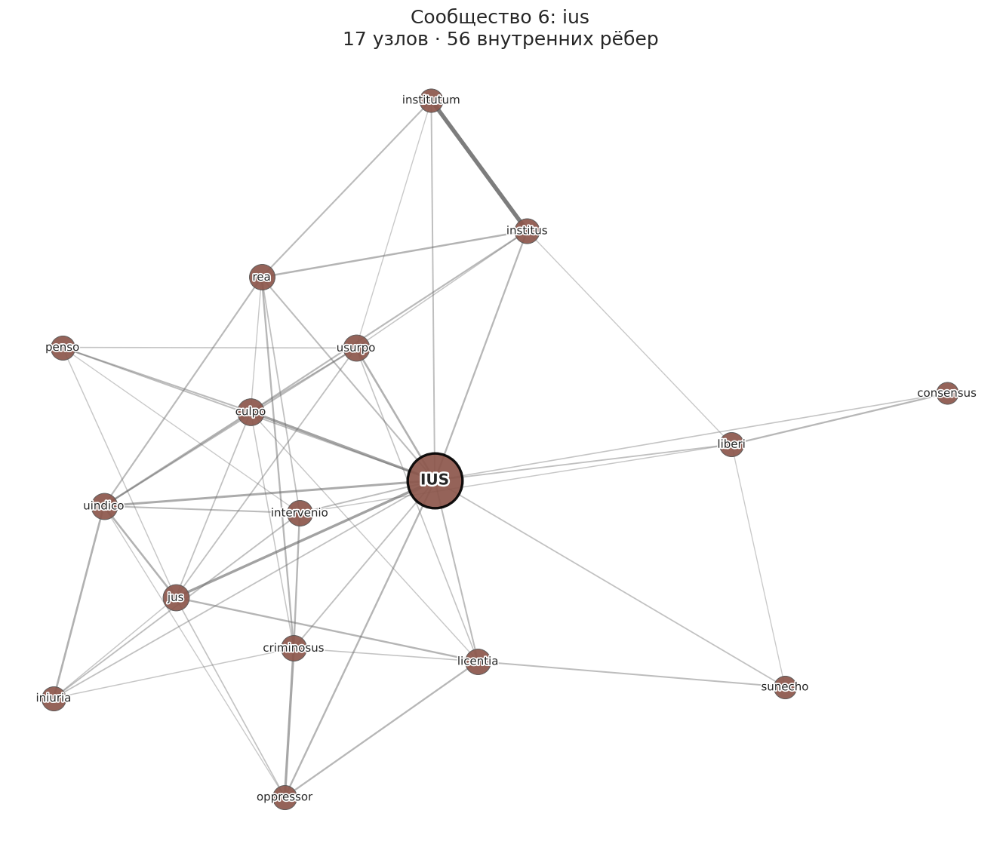

Сохранено: figures/communities/community_6_ius.png


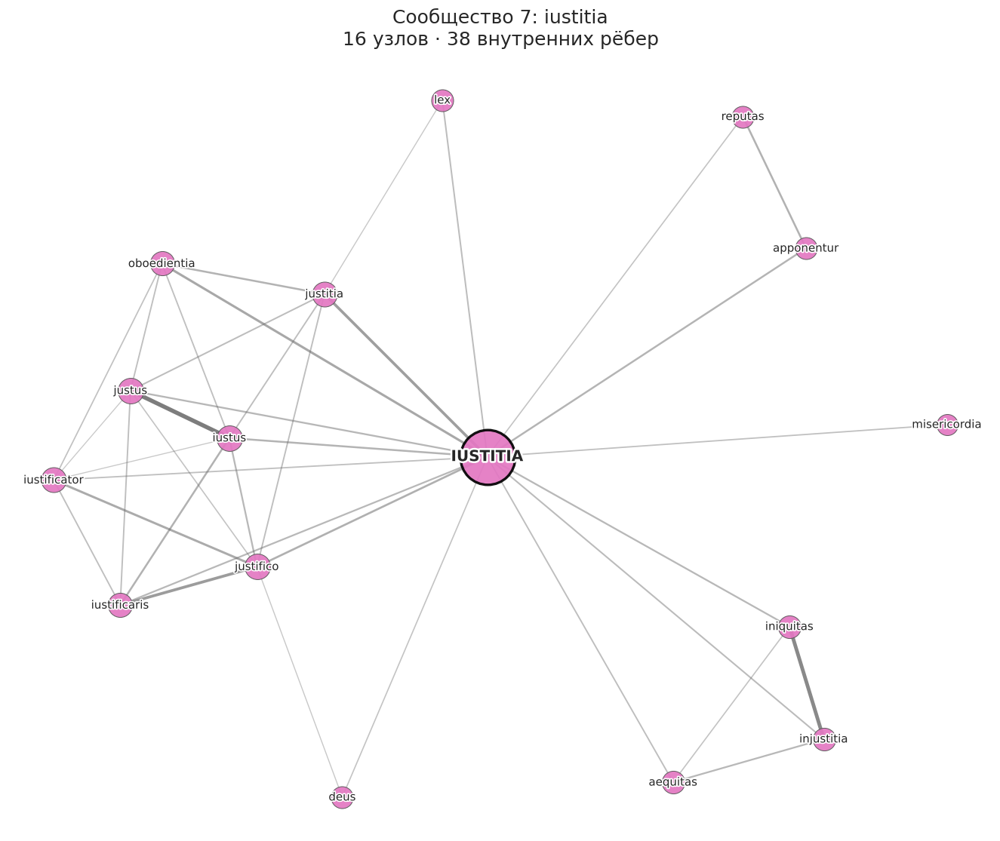

Сохранено: figures/communities/community_7_iustitia.png


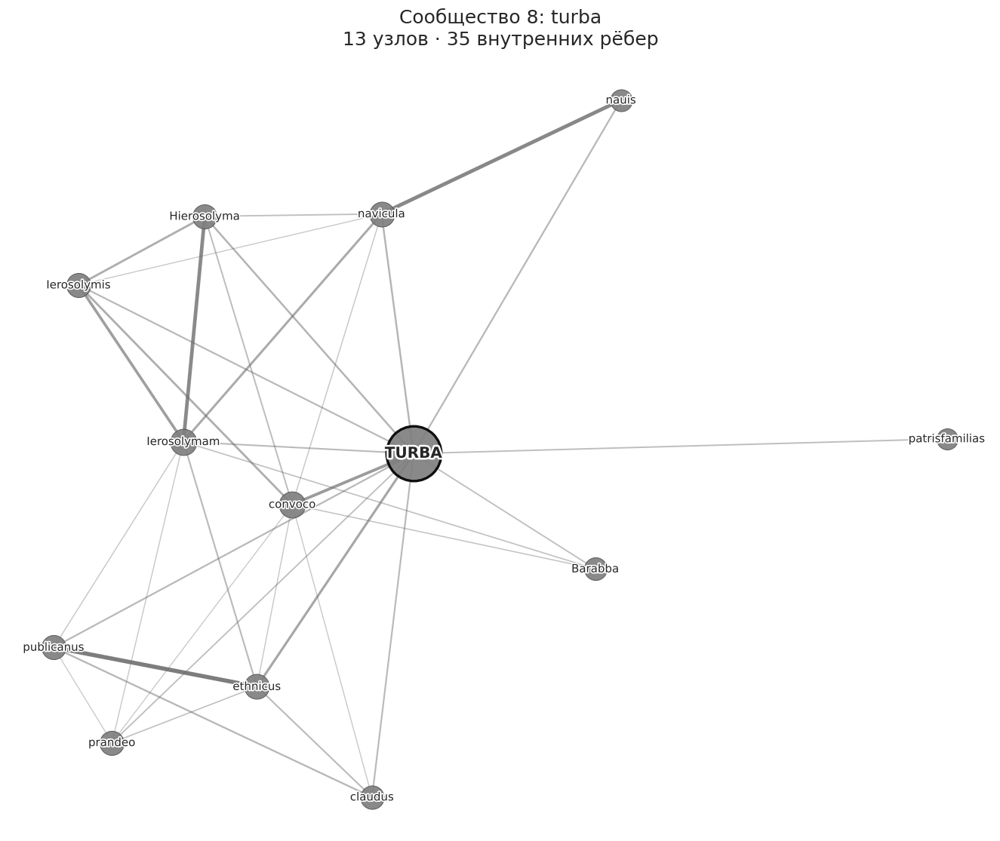

Сохранено: figures/communities/community_8_turba.png


In [11]:
for c in communities:
    fig, anchor = draw_community(G, membership, community_colors, c, THRESHOLD)
    save_figure(fig, f"community_{c}_{anchor}", folder=os.path.join(FIG_DIR, "communities"))

## 9. Локальные сети по схеме 6–4

Для каждой целевой леммы строится локальная сеть: 6 ближайших соседей первого уровня и по 4 ближайших соседа каждого из них. Порог здесь не используется. Таблица соответствует табл. 2 статьи (для 11 обозначений человеческих общностей). Цвет узлов на рисунках обозначает кластеры локальной сети (алгоритм Лувена), как в работах разработчиков модели. В статью вошли сети *populus* и *gens* (рис. 2, панели A и B), *plebs* (рис. 3) и *civitas* (рис. 4); остальные сохраняются в папку `figures/local_networks/`.

In [12]:
local_networks = {term: local_network_6_4(term) for term in TARGET_TERMS}

rows = []
for term, g in local_networks.items():
    first = [w for w, _ in wv.most_similar(term, topn=LOCAL_FIRST)]
    others = [f"{t} ({g.nodes[t]['level']}-й)" for t in TARGET_TERMS if t in g and t != term]
    rows.append({"Лемма": term, "Шесть соседей первого уровня": ", ".join(first),
                 "Другие целевые леммы (уровень)": ", ".join(others) or "–",
                 "Узлов": g.number_of_nodes(), "Рёбер": g.number_of_edges()})
display(Markdown("**Таблица 2. Локальные сети целевых лемм**"))
display(pd.DataFrame(rows).set_index("Лемма"))

**Таблица 2. Локальные сети целевых лемм**

,Шесть соседей первого уровня,Другие целевые леммы (уровень),Узлов,Рёбер
Лемма,,,,
populus,"Israel, Israelitaris, Israhel, gens, plebs, al...","plebs (1-й), gens (1-й), natio (2-й), congrega...",22,27
plebs,"re-pello, populus, plebibus, Tyrius, congregat...","populus (1-й), gens (2-й), congregatio (1-й)",29,30
gens,"credituras, natio, dis-permulceo, populus, Isr...","populus (1-й), plebs (2-й), natio (1-й)",20,27
natio,"gens, disperdo, tortuosus, credituras, iudaeor...","populus (2-й), gens (1-й)",23,27
multitudo,"multitudi, paucitas, congregatio, paucus, nume...",congregatio (1-й),28,29
congregatio,"discissio, congrego, segregatio, divisio, mult...","gens (2-й), multitudo (1-й), ecclesia (2-й)",30,30
turba,"convoco, ethnicus, agmen, Hierosolyma, navicul...",–,29,29
uulgus,"idea, usitor, inperitor, appellatiuum, praeter...",–,29,30
ciuitas,"ciuis, Babylonius, Ierusal, Hierusal, Babylo, ...",–,18,26


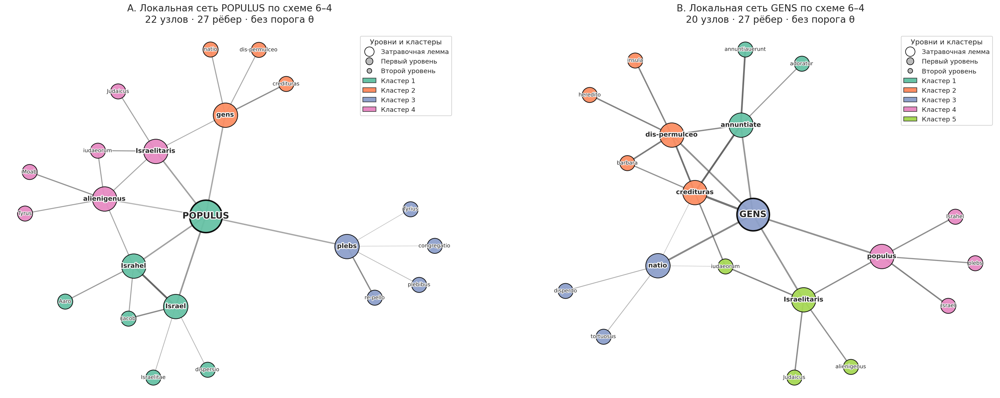

Сохранено: figures/Fig2_local_networks_populus_gens.png


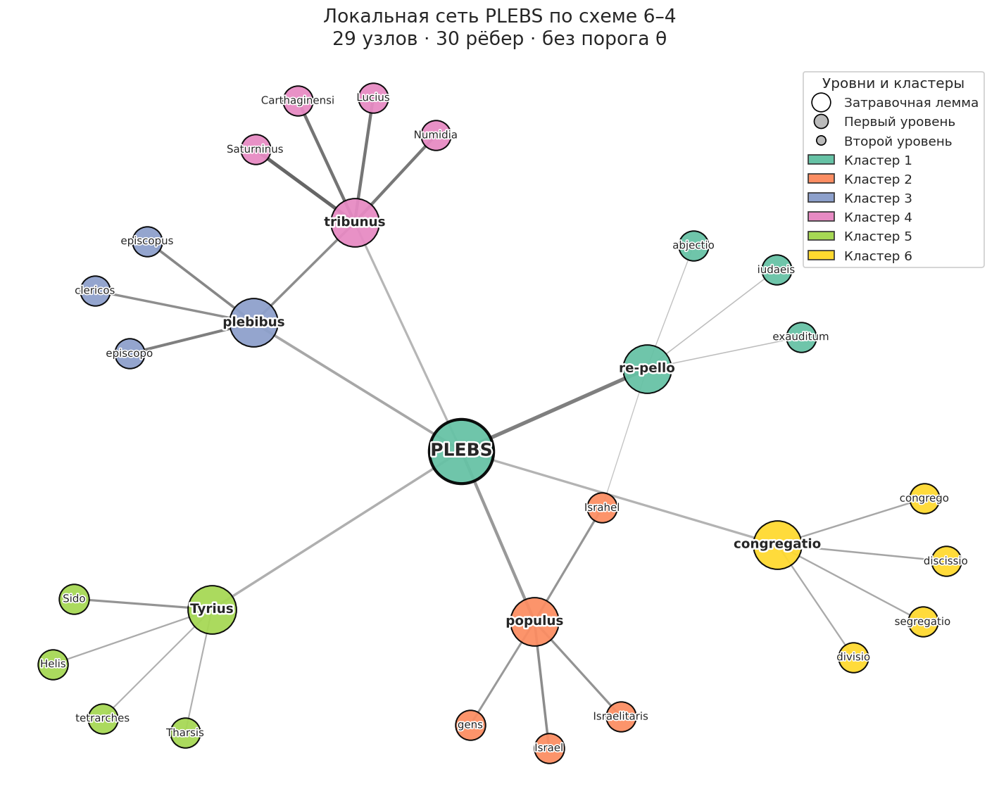

Сохранено: figures/Fig3_local_network_plebs.png


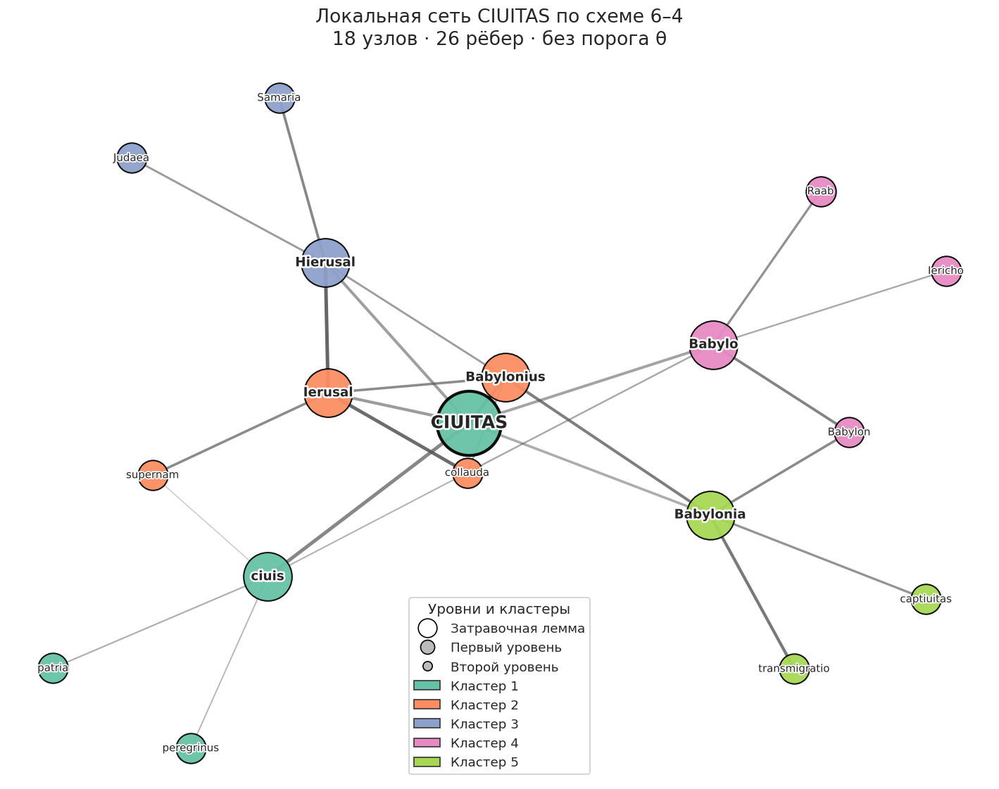

Сохранено: figures/Fig4_local_network_civitas.png


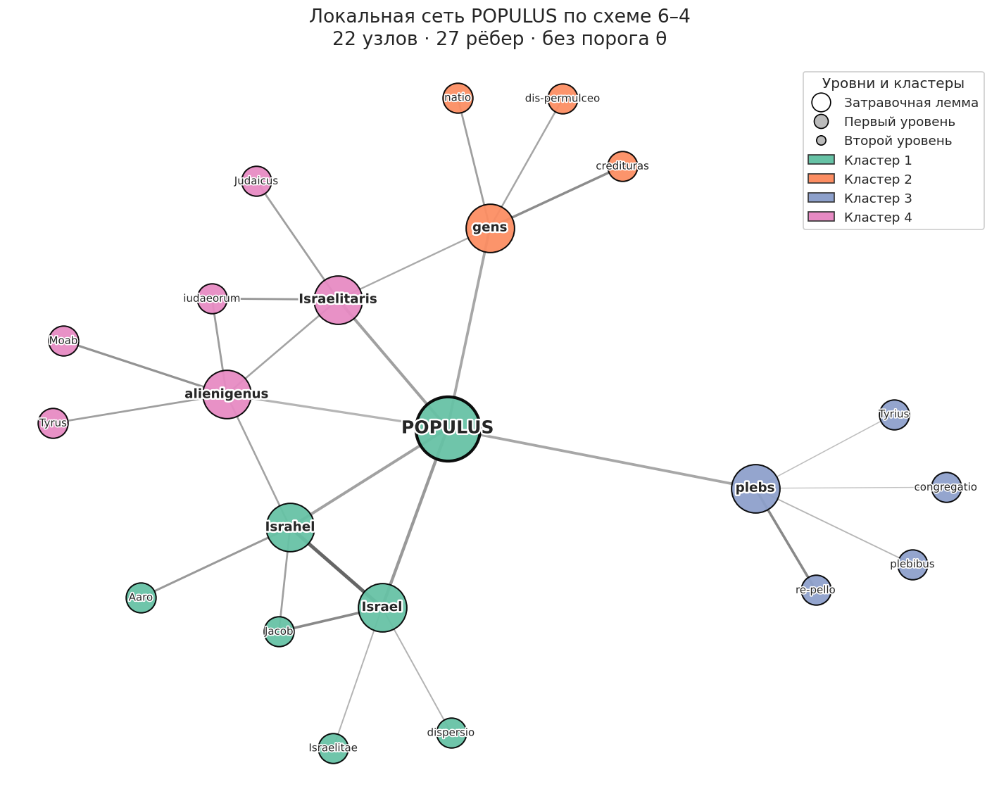

Сохранено: figures/local_networks/local_6_4_populus.png


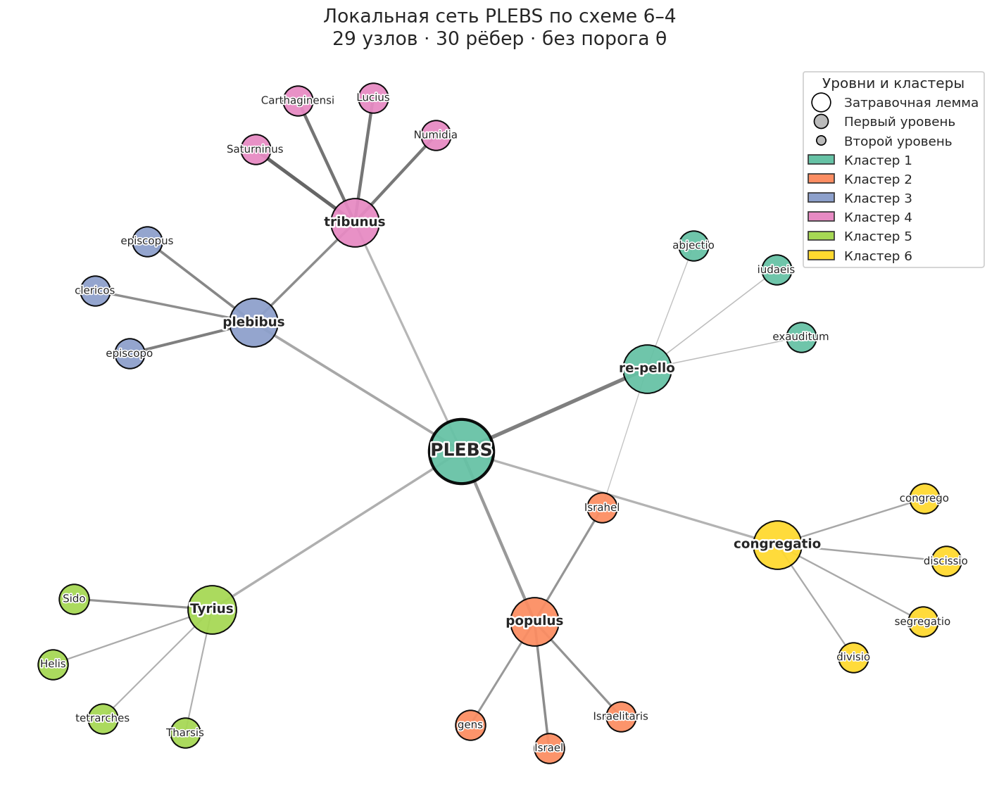

Сохранено: figures/local_networks/local_6_4_plebs.png


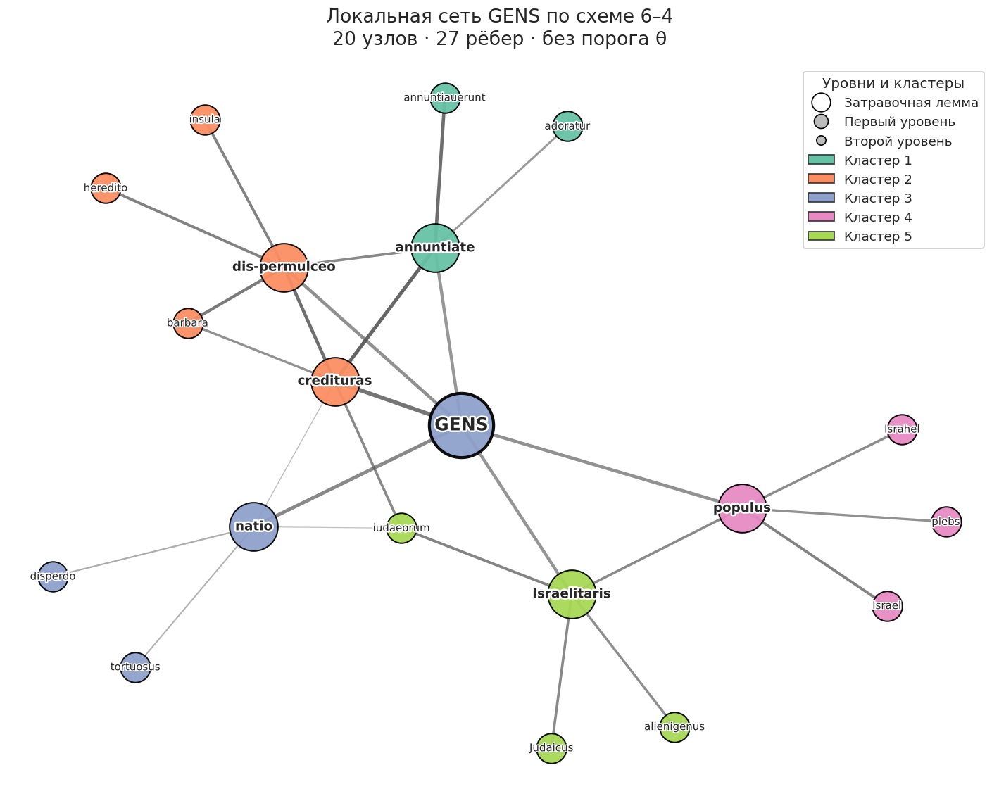

Сохранено: figures/local_networks/local_6_4_gens.png


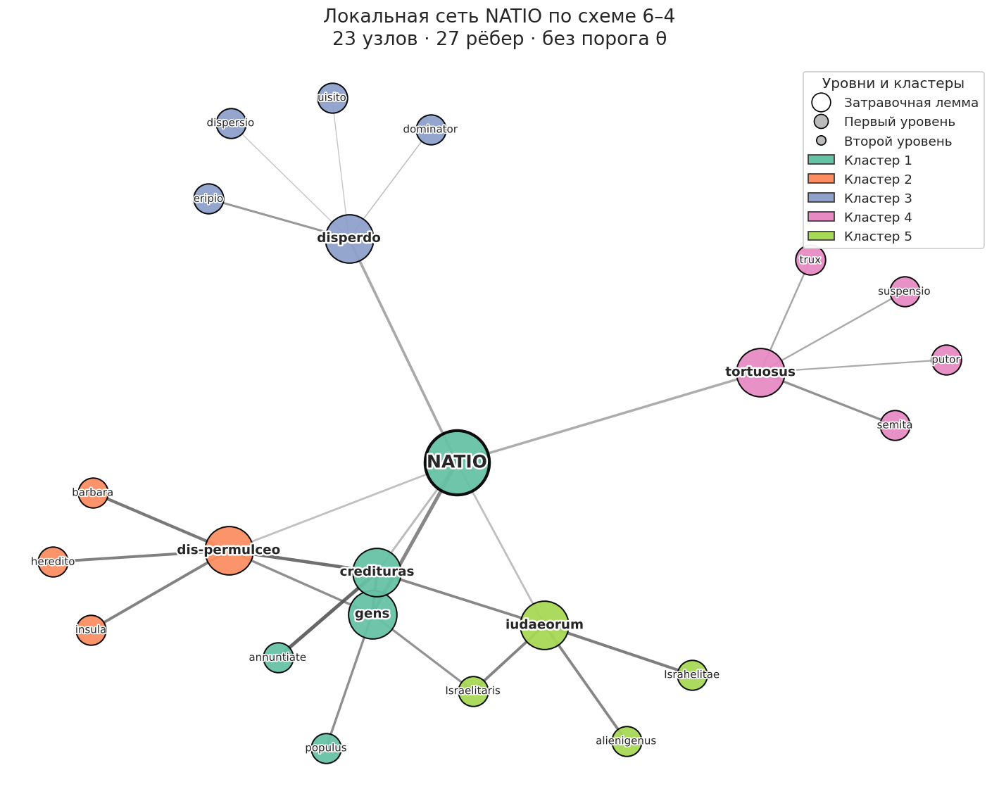

Сохранено: figures/local_networks/local_6_4_natio.png


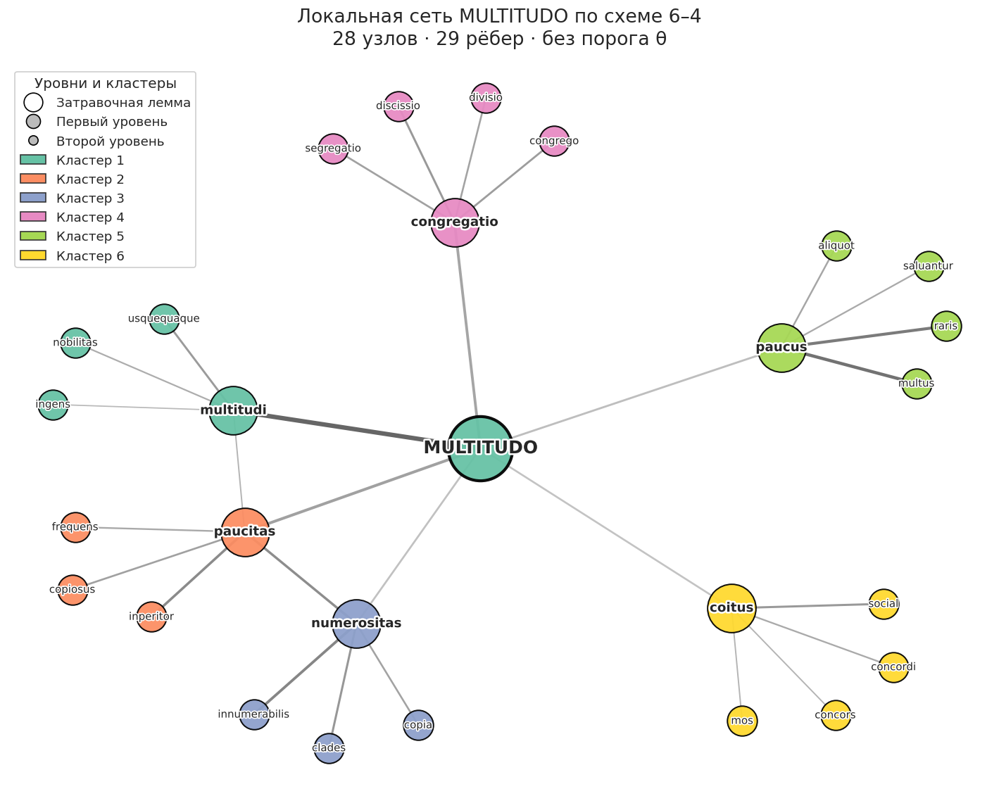

Сохранено: figures/local_networks/local_6_4_multitudo.png


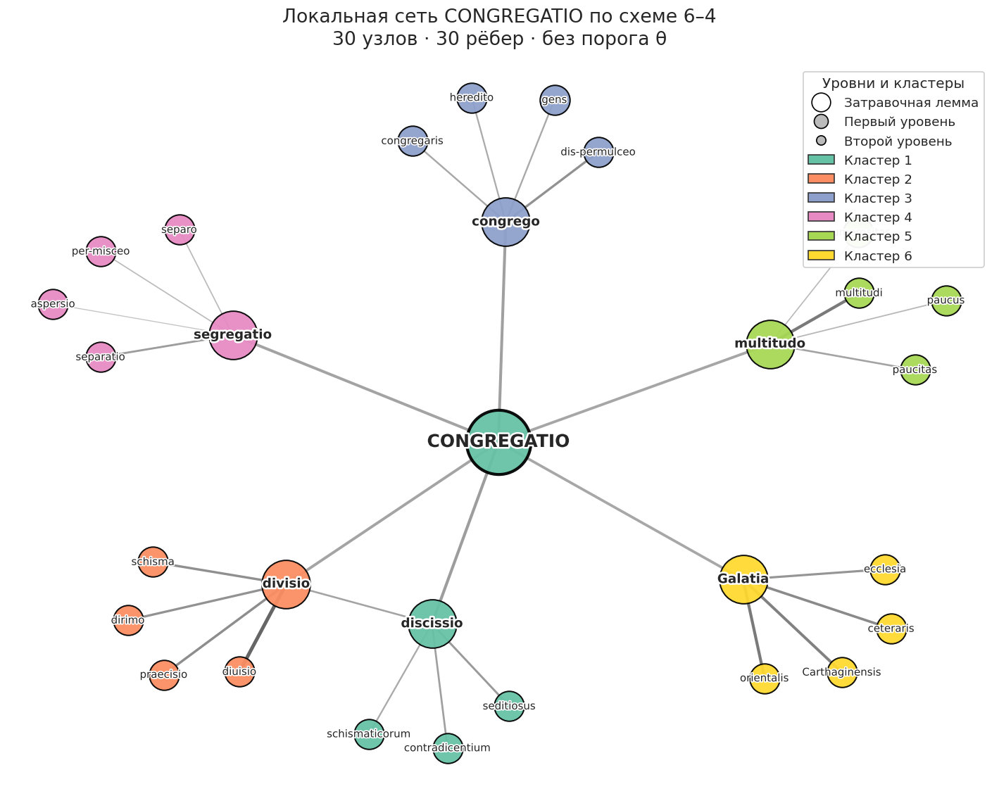

Сохранено: figures/local_networks/local_6_4_congregatio.png


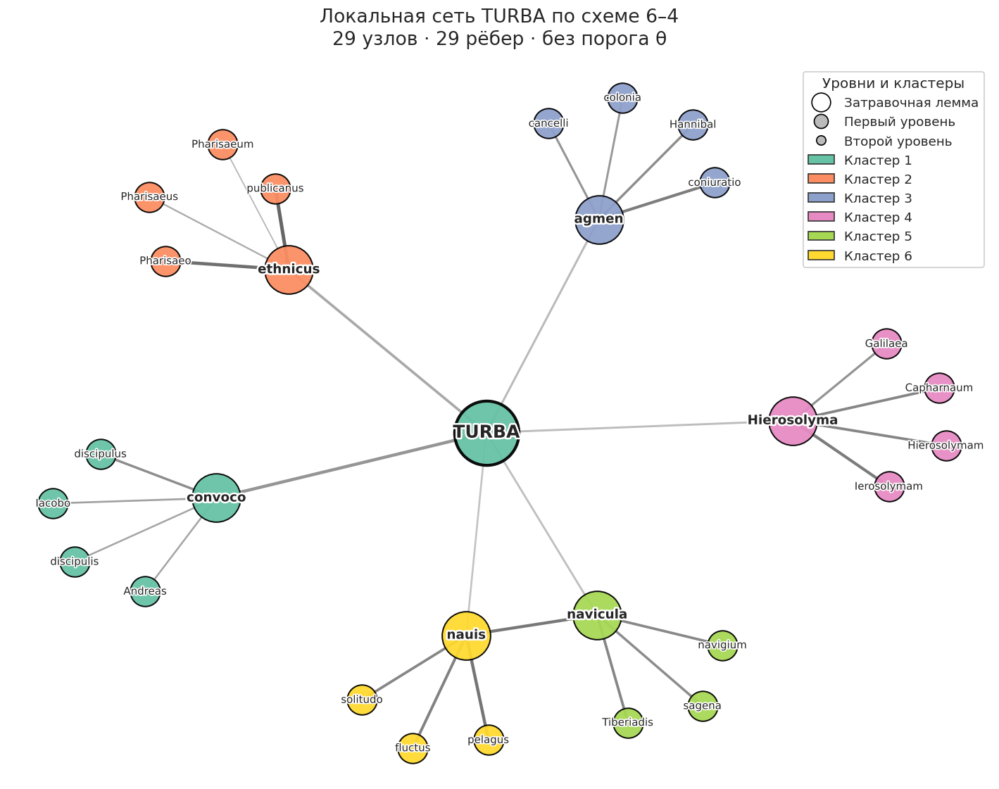

Сохранено: figures/local_networks/local_6_4_turba.png


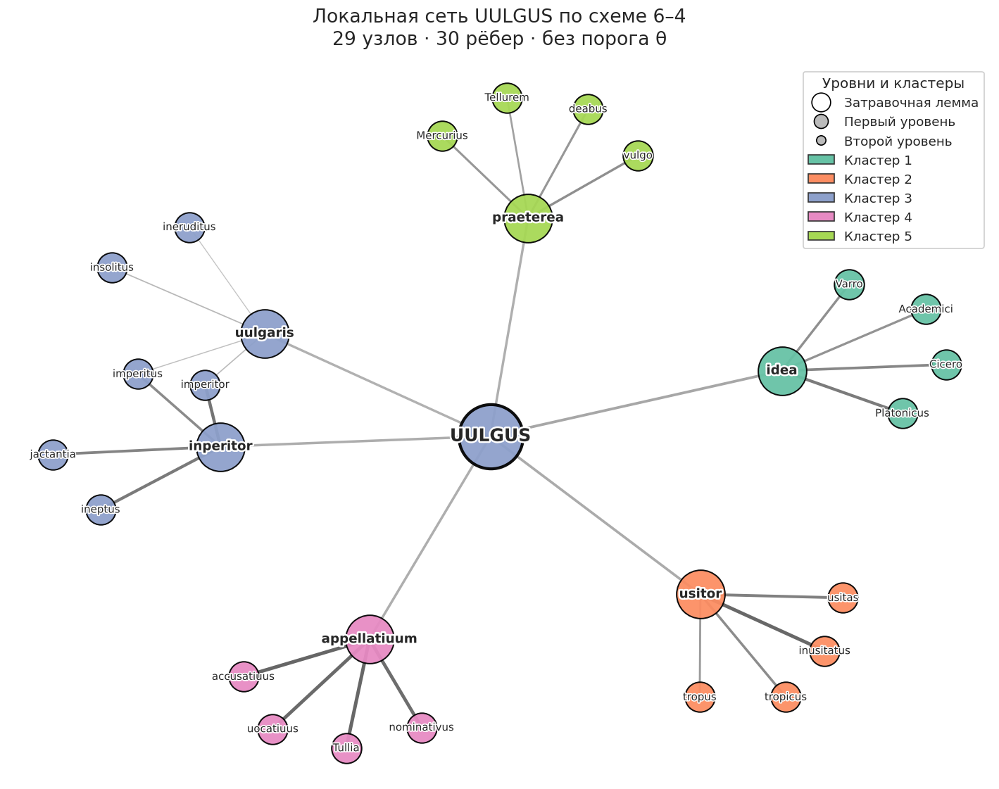

Сохранено: figures/local_networks/local_6_4_uulgus.png


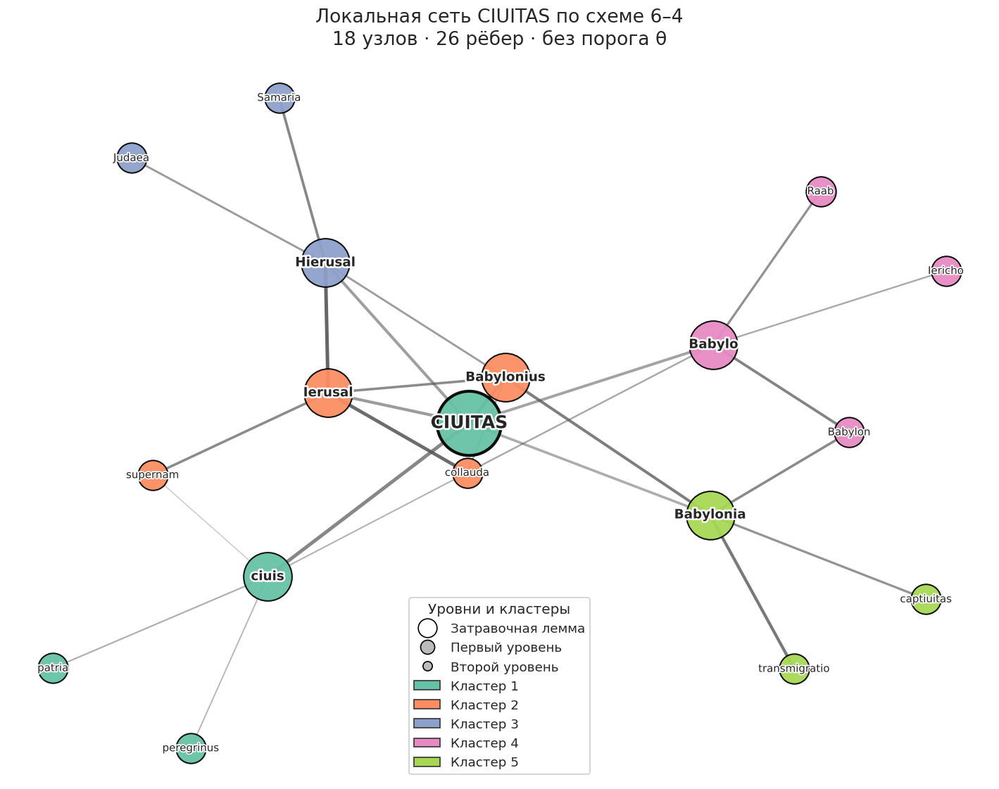

Сохранено: figures/local_networks/local_6_4_ciuitas.png


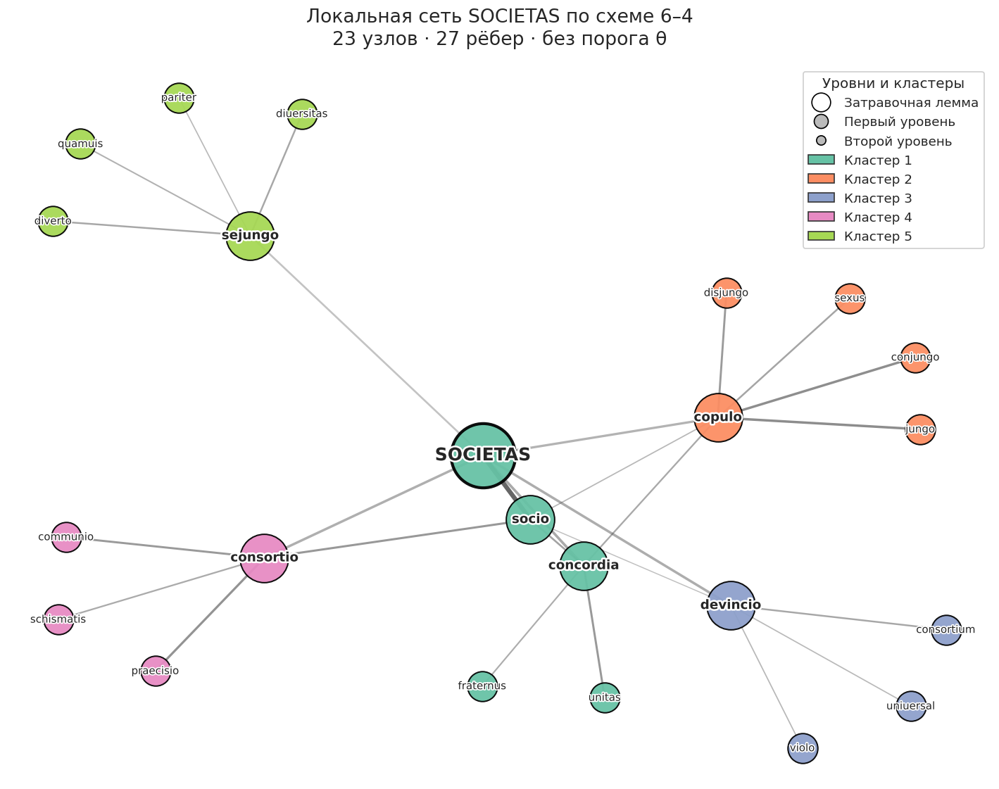

Сохранено: figures/local_networks/local_6_4_societas.png


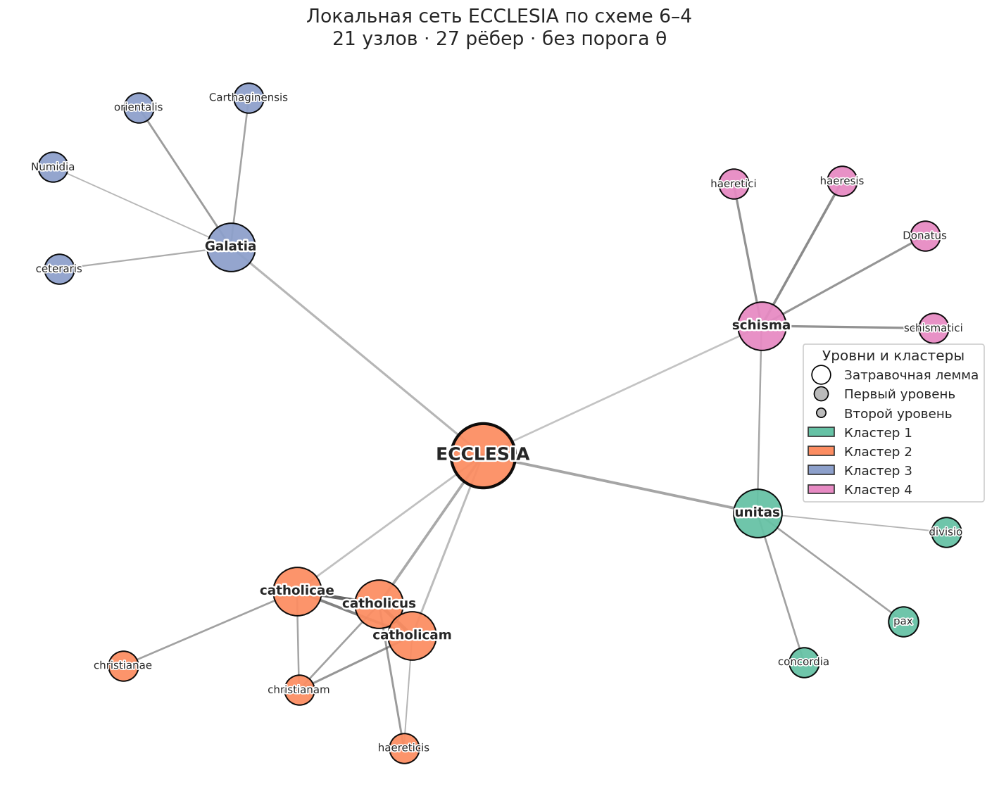

Сохранено: figures/local_networks/local_6_4_ecclesia.png


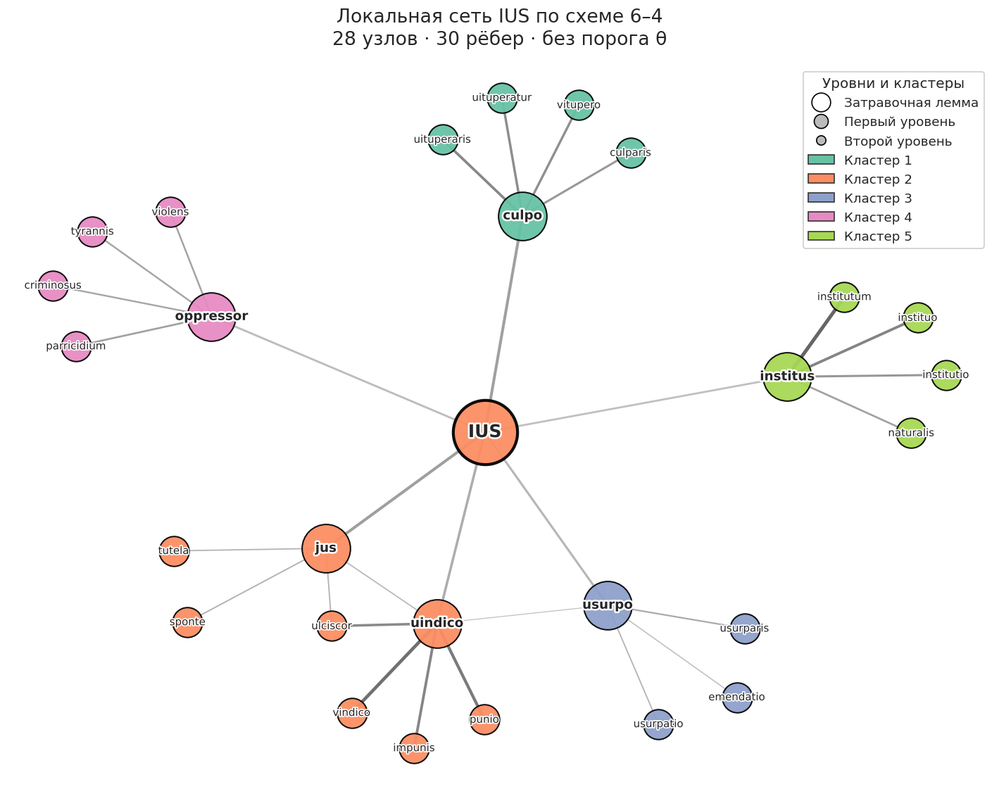

Сохранено: figures/local_networks/local_6_4_ius.png


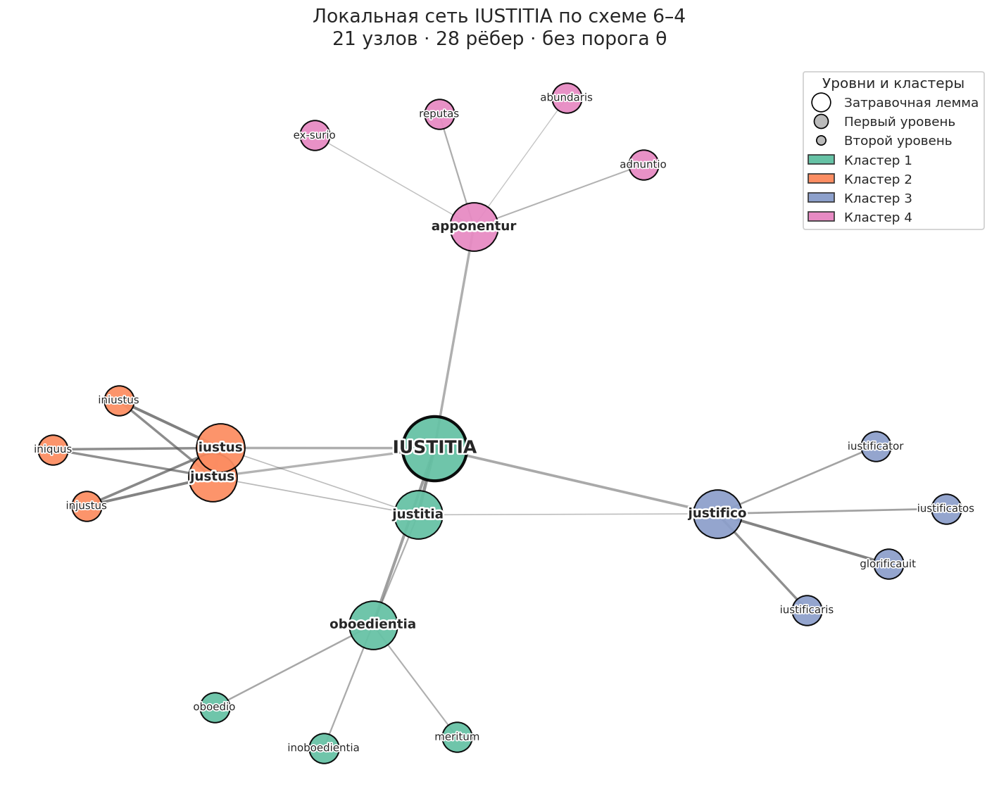

Сохранено: figures/local_networks/local_6_4_iustitia.png


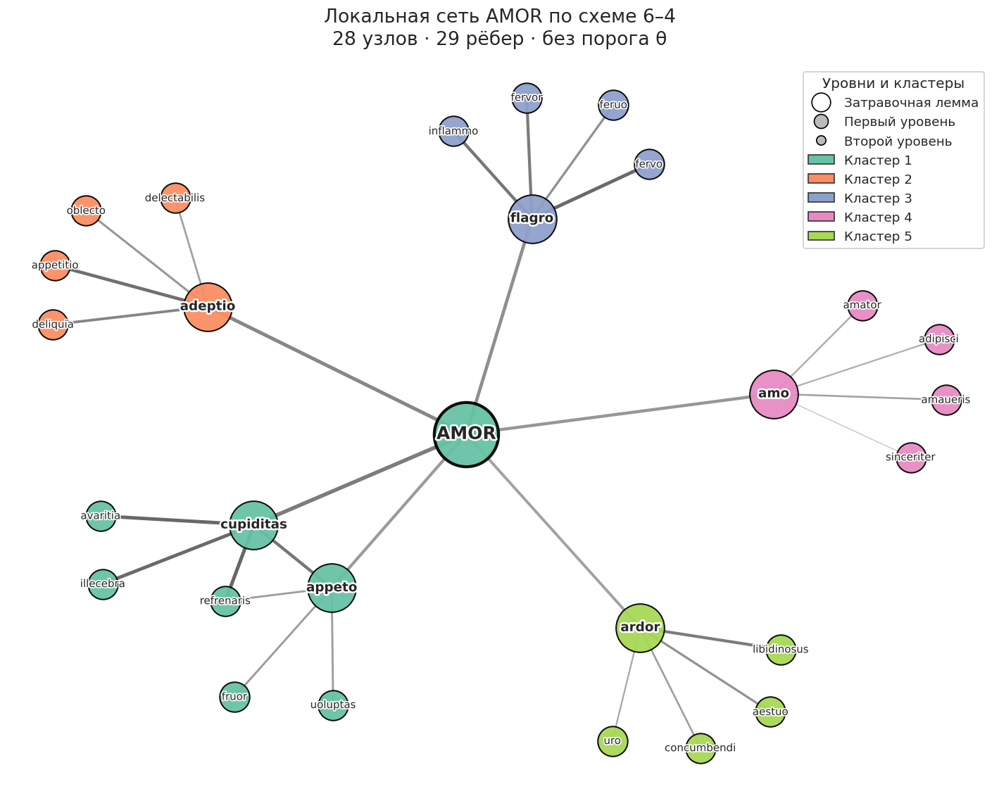

Сохранено: figures/local_networks/local_6_4_amor.png


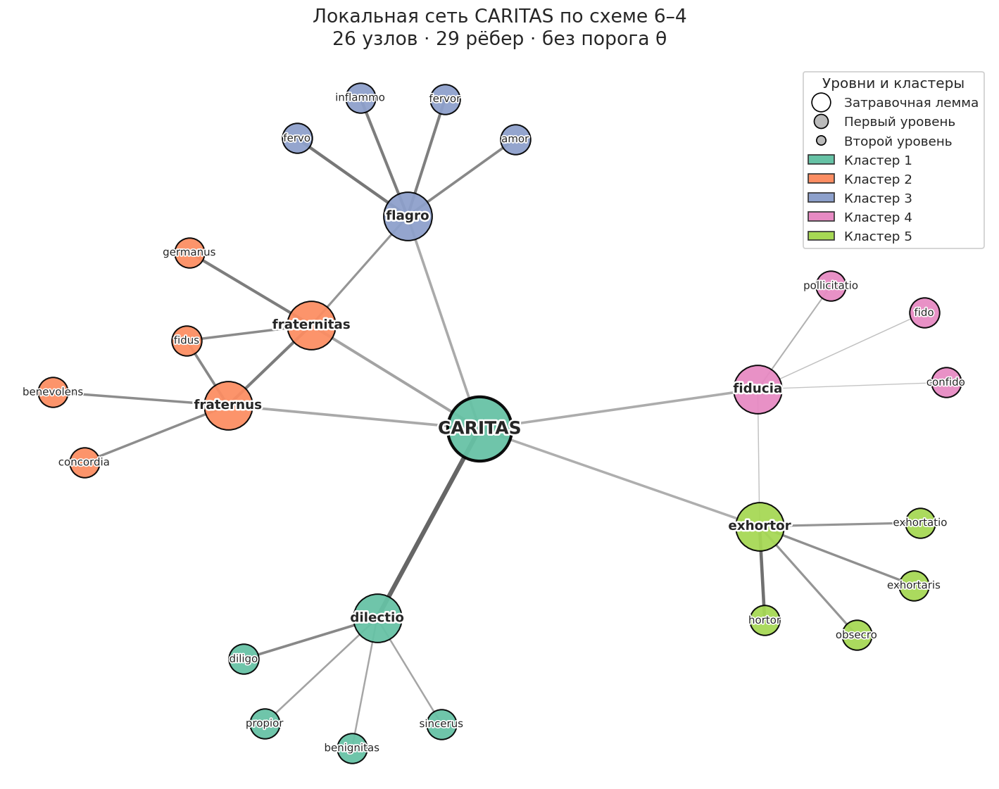

Сохранено: figures/local_networks/local_6_4_caritas.png


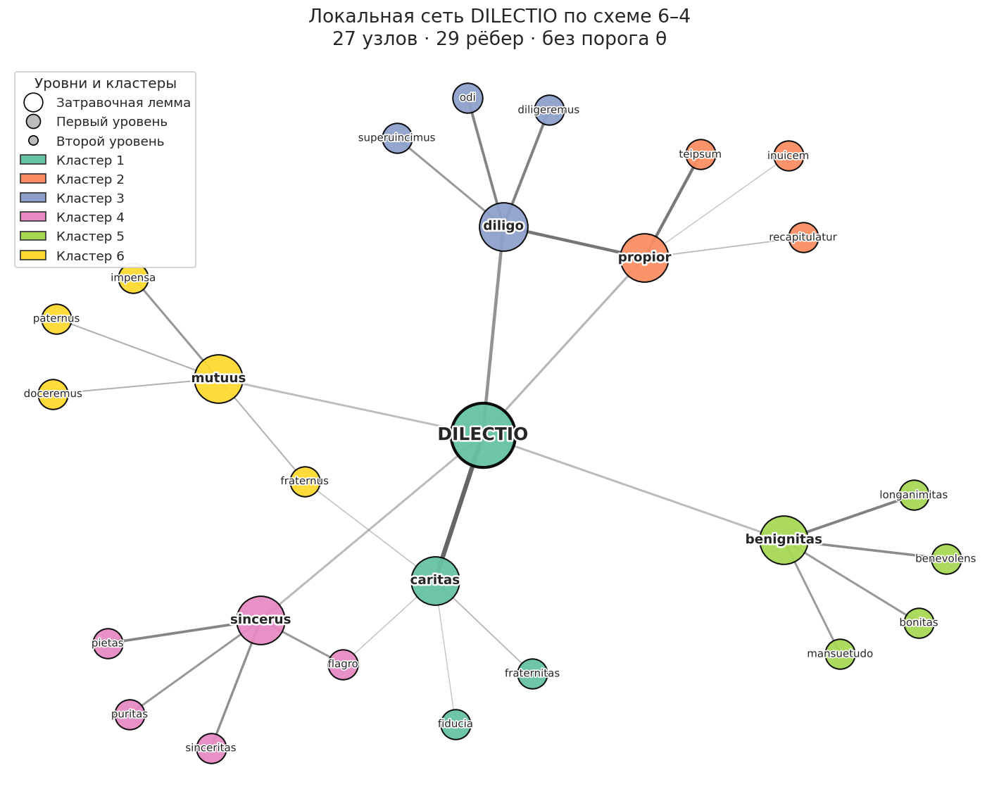

Сохранено: figures/local_networks/local_6_4_dilectio.png


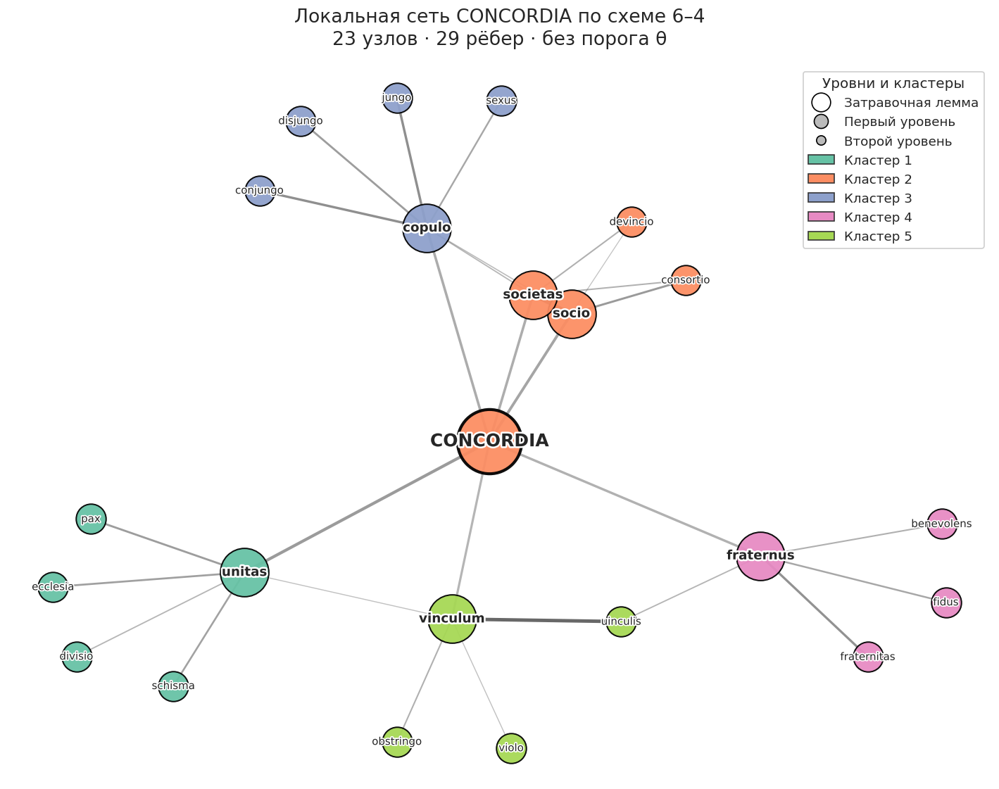

Сохранено: figures/local_networks/local_6_4_concordia.png


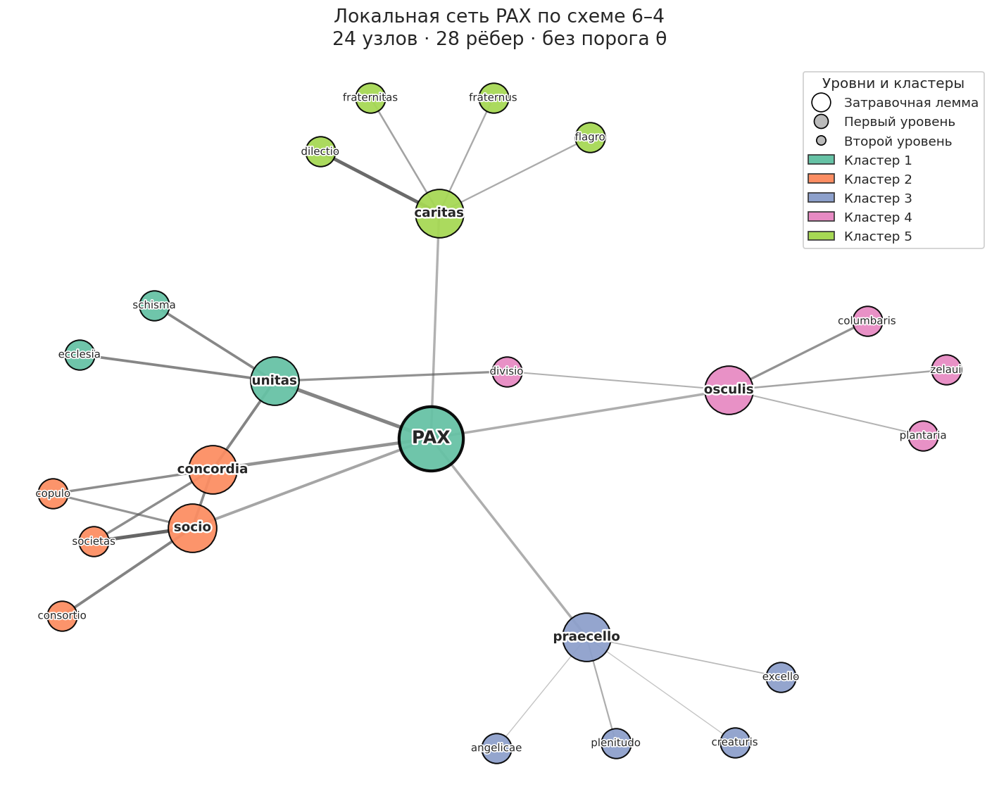

Сохранено: figures/local_networks/local_6_4_pax.png


In [13]:
# Рис. 2: populus и gens рядом (панели A и B)
fig, axes = plt.subplots(1, 2, figsize=(30, 11))
draw_local_network("populus", local_networks["populus"], ax=axes[0], panel="A. ")
draw_local_network("gens", local_networks["gens"], ax=axes[1], panel="B. ")
save_figure(fig, "Fig2_local_networks_populus_gens")

# Рис. 3 и 4: plebs и ciuitas
save_figure(draw_local_network("plebs", local_networks["plebs"]), "Fig3_local_network_plebs")
save_figure(draw_local_network("ciuitas", local_networks["ciuitas"]), "Fig4_local_network_civitas")

# Все 18 локальных сетей — в отдельную папку
for term, g in local_networks.items():
    save_figure(draw_local_network(term, g), f"local_6_4_{term}",
                folder=os.path.join(FIG_DIR, "local_networks"))

## 10. Сходства восемнадцати целевых лемм

Тепловая карта показывает косинусное сходство каждой пары целевых лемм. Чёрные линии разделяют группы лемм, соответствующие сообществам основной сети.

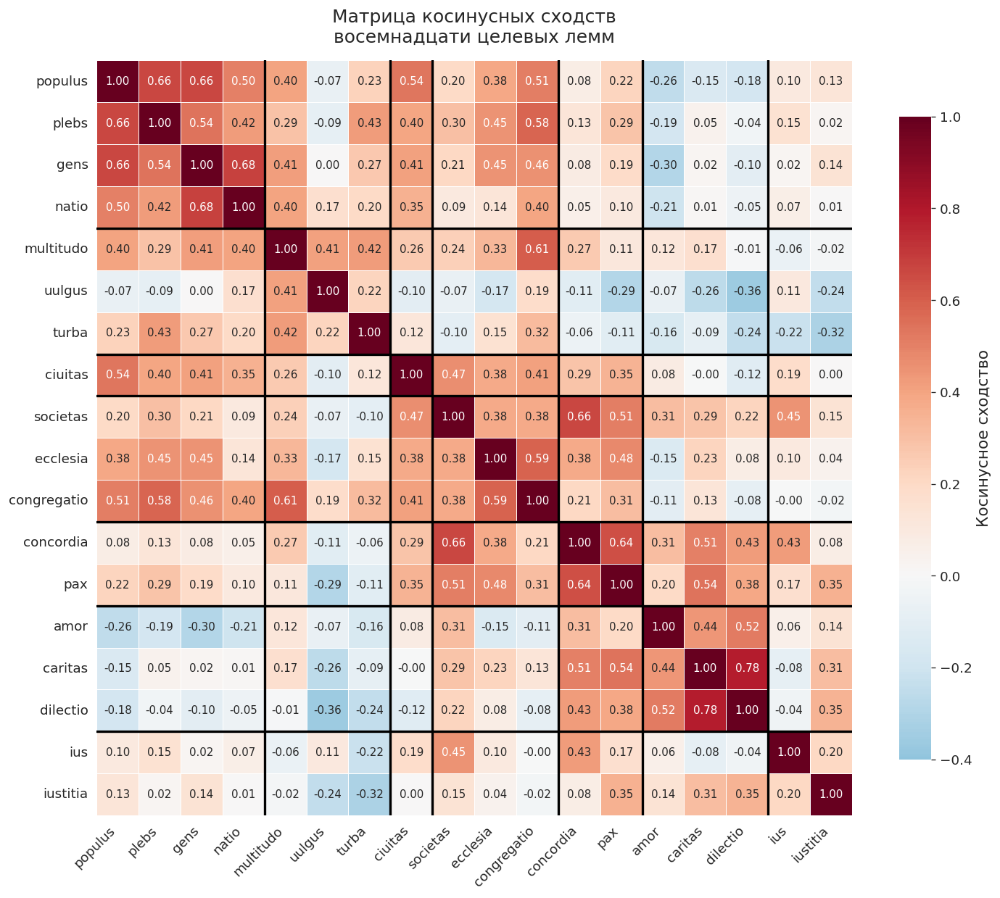

Сохранено: figures/target_similarity_matrix.png


In [14]:
order = ["populus", "plebs", "gens", "natio", "multitudo", "uulgus", "turba", "ciuitas",
         "societas", "ecclesia", "congregatio", "concordia", "pax",
         "amor", "caritas", "dilectio", "ius", "iustitia"]
matrix = pd.DataFrame(cosine_similarity(np.array([wv[t] for t in order])), index=order, columns=order)

fig, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(matrix, cmap="RdBu_r", center=0, vmin=-0.4, vmax=1.0, annot=True, fmt=".2f",
            annot_kws={"size": 9}, linewidths=0.5, linecolor="white", square=True,
            cbar_kws={"label": "Косинусное сходство", "shrink": 0.8}, ax=ax)
for boundary in [4, 7, 8, 11, 13, 16]:
    ax.axhline(boundary, color="black", linewidth=2)
    ax.axvline(boundary, color="black", linewidth=2)
ax.set_title("Матрица косинусных сходств\nвосемнадцати целевых лемм", pad=15)
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
save_figure(fig, "target_similarity_matrix")

## 11. Числа, приводимые в тексте статьи

Здесь собраны значения, на которые опираются разделы 4 и 5 статьи. Каждое вычисляется непосредственно по модели, поэтому любое из них можно проверить.

In [15]:
sim = lambda a, b: round(float(wv.similarity(a, b)), 3)
freq = lambda w: wv.get_vecattr(w, "count")
rank_among = lambda target, word: [w for w, _ in wv.most_similar(target, topn=len(wv))].index(word) + 1
roman = ["Romulus", "Numa", "Trojanus", "Latius", "curia", "decurio", "colonia", "prouincia"]

facts = [
    ("3", "Порог θ и 99-й перцентиль", f"θ = {THRESHOLD:.2f}; P99 = {p99:.4f}"),
    ("4", "Основная сеть", f"{G.number_of_nodes()} узлов, {G.number_of_edges()} рёбер, Q = {Q:.3f}"),
    ("5", "populus – ius / iustitia", f"{sim('populus', 'ius')} / {sim('populus', 'iustitia')}"),
    ("5", "gens – ius / iustitia", f"{sim('gens', 'ius')} / {sim('gens', 'iustitia')}"),
    ("5", "populus – senatus / consul", f"{sim('populus', 'senatus')} / {sim('populus', 'consul')}"),
    ("5", "plebs – re-pello / repello", f"{sim('plebs', 're-pello')} / {sim('plebs', 'repello')}"),
    ("5", "Ближайшие соседи repello", ", ".join(w for w, _ in wv.most_similar("repello", topn=6))),
    ("5", "Ближайшие соседи re-pello", ", ".join(w for w, _ in wv.most_similar("re-pello", topn=6))),
    ("5", "plebibus – episcopus", str(sim("plebibus", "episcopus"))),
    ("5", "Частота plebibus / populis", f"{freq('plebibus')} / {freq('populis')}"),
    ("5", "Ближайшие соседи populis", ", ".join(w for w, _ in wv.most_similar("populis", topn=6))),
    ("5", "Ближайшие соседи tribunus", ", ".join(w for w, _ in wv.most_similar("tribunus", topn=10))),
    ("5", "ciuitas – populus; место ciuitas среди соседей populus",
          f"{sim('ciuitas', 'populus')}; {rank_among('populus', 'ciuitas')}-е"),
    ("5", "ciuitas – gens / natio / plebs",
          f"{sim('ciuitas', 'gens')} / {sim('ciuitas', 'natio')} / {sim('ciuitas', 'plebs')}"),
    ("5", "Римская лексика: сходство с ciuitas",
          f"{min(sim('ciuitas', w) for w in roman)}–{max(sim('ciuitas', w) for w in roman)}"),
    ("5", "Римская лексика: сходство с populus",
          f"{min(sim('populus', w) for w in roman)}–{max(sim('populus', w) for w in roman)}"),
    ("5", "Israel – populus / ciuitas", f"{sim('Israel', 'populus')} / {sim('Israel', 'ciuitas')}"),
    ("5", "ciuitas – multitudo / vinculum / concordia",
          f"{sim('ciuitas', 'multitudo')} / {sim('ciuitas', 'vinculum')} / {sim('ciuitas', 'concordia')}"),
    ("5", "vinculum – concordia", str(sim("vinculum", "concordia"))),
    ("5", "multitudo – populus / turba; populus – turba",
          f"{sim('multitudo', 'populus')} / {sim('multitudo', 'turba')}; {sim('populus', 'turba')}"),
    ("5", "Частота vulgo", str(freq("vulgo"))),
    ("5", "ecclesia – populus / plebs / congregatio",
          f"{sim('ecclesia', 'populus')} / {sim('ecclesia', 'plebs')} / {sim('ecclesia', 'congregatio')}"),
    ("5", "ecclesia – corpus", str(sim("ecclesia", "corpus"))),
    ("5", "populus – consensus / utilitas", f"{sim('populus', 'consensus')} / {sim('populus', 'utilitas')}"),
    ("5", "populus – amor / caritas / dilectio / diligo",
          " / ".join(str(sim("populus", w)) for w in ["amor", "caritas", "dilectio", "diligo"])),
    ("5", "populus – concordia / multitudo",
          f"{sim('populus', 'concordia')} / {sim('populus', 'multitudo')}"),
    ("5", "coetus, rationalis, sociatus в словаре модели",
          ", ".join(f"{w}: {'есть' if w in wv else 'нет'}" for w in ["coetus", "rationalis", "sociatus"])),
]
display(pd.DataFrame(facts, columns=["Раздел статьи", "Что проверяется", "Значение"])
        .set_index(["Раздел статьи", "Что проверяется"]))

Значение
Раздел статьи Что проверяется                                                                                      
3             Порог θ и 99-й перцентиль                                                      θ = 0.47; P99 = 0.4651
4             Основная сеть                                                        232 узлов, 1397 рёбер, Q = 0.637
5             populus – ius / iustitia                                                                0.098 / 0.132
              gens – ius / iustitia                                                                    0.02 / 0.143
              populus – senatus / consul                                                              0.135 / 0.086
              plebs – re-pello / repello                                                              0.745 / 0.363
              Ближайшие соседи repello                            despicio, immitis, abjectio, flagellum, obiurg...
              Ближайшие соседи re-pello                           plebs, exauditum, iudaeis, abjectio, Israhel, ...
              plebibus – episcopus                                                                            0.717
              Частота plebibus / populis                                                                    27 / 10
              Ближайшие соседи populis                            inhabito, rex, inhabitaris, dominus, retribues...
              Ближайшие соседи tribunus                           Saturninus, Carthaginensi, Lucius, Numidia, pr...
              ciuitas – populus; место ciuitas среди соседей ...                                        0.539; 23-е
              ciuitas – gens / natio / plebs                                                  0.412 / 0.351 / 0.395
              Римская лексика: сходство с ciuitas                                                       0.569–0.649
              Римская лексика: сходство с populus                                                       0.212–0.418
              Israel – populus / ciuitas                                                              0.702 / 0.319
              ciuitas – multitudo / vinculum / concordia                                      0.257 / 0.136 / 0.288
              vinculum – concordia                                                                            0.649
              multitudo – populus / turba; populus – turba                                       0.4 / 0.422; 0.231
              Частота vulgo                                                                                      16
              ecclesia – populus / plebs / congregatio                                         0.384 / 0.445 / 0.59
              ecclesia – corpus                                                                               0.162
              populus – consensus / utilitas                                                          -0.04 / 0.126
              populus – amor / caritas / dilectio / diligo                         -0.255 / -0.15 / -0.184 / -0.098
              populus – concordia / multitudo                                                           0.075 / 0.4
              coetus, rationalis, sociatus в словаре модели             coetus: нет, rationalis: нет, sociatus: нет